In [156]:
import numpy as np
from pyuvdata import UVData
import matplotlib.pyplot as plt
import h5py
from astropy.io import fits
from scipy import signal
from numpy.polynomial import Polynomial as Poly
from scipy.optimize import curve_fit
from matplotlib.patches import Ellipse

In [157]:
cmap = plt.get_cmap('inferno')
indices = np.linspace(0, cmap.N, 6)
my_colors1 = [cmap(int(i)) for i in indices]

In [158]:
cmap2 = plt.get_cmap('viridis')
indices2 = np.linspace(0, cmap.N, 6)
my_colors2 = [cmap2(int(i)) for i in indices2]

In [159]:
import sys
sys.path.insert(0, '/Users/pstar/EORanalysis/py_scripts')
import auto_utils as ut

In [160]:
data_path = "/Users/pstar/EORanalysis/mwax_data/ssins_phased_gains_2.0sec_40kHz_autos/"

In [161]:
meta_path = "/Users/pstar/EORanalysis/mwax_data/metafits/2021/"

In [162]:
with h5py.File("/Users/pstar/EORanalysis/mwax_data/abs_freq_gains.h5",'r') as f:
    print(list(f.keys()))
    freq_gains = f['gains'][:]

['gains']


In [8]:
uv1 = UVData()
uv1.read(data_path + "1321443424.uvfits")

In [9]:
uv2 = UVData()
uv2.read(data_path + "1321445344.uvfits")

In [10]:
uv3 = UVData()
uv3.read(data_path + "1321446784.uvfits")

In [11]:
uv4 = UVData()
uv4.read(data_path + "1321448584.uvfits")

In [12]:
uv5 = UVData()
uv5.read(data_path + "1321617752.uvfits")

In [13]:
ant_nums = np.unique(uv1.ant_1_array)
ant_nums_use = ant_nums[ant_nums != 15]
uv1.select(antenna_nums=ant_nums_use)
uv2.select(antenna_nums=ant_nums_use)
uv3.select(antenna_nums=ant_nums_use)
uv4.select(antenna_nums=ant_nums_use)
uv5.select(antenna_nums=ant_nums_use)

In [14]:
uv2.data_array.shape

(7560, 1, 768, 4)

In [15]:
meta = fits.open(meta_path + "1321443424.metafits")

In [16]:
meta[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                    8 / array data type                                
NAXIS   =                    0 / number of array dimensions                     
EXTEND  =                    T                                                  
GPSTIME =           1321443424 / [s] GPS time of observation start              
EXPOSURE=                  120 / [s] duration of observation                    
FILENAME= 'high_2021A_2459538_EOR0_RADec0.0,-27.0_Ch143' / Name of observation  
MJD     =    59538.48386574074 / [days] MJD of observation                      
DATE-OBS= '2021-11-20T11:36:46' / [UT] Date and time of observation             
LST     =     350.817211738374 / [deg] LST                                      
HA      = ' 00:30:27.04'       / [hours] hour angle of pointing center          
AZIMUTH =                 90.0 / [deg] Azimuth of pointing center               
ALTITUDE=    83.191199999999

In [163]:
# get metadata
meta1 = ut.parse_metadata(meta_path + "1321443424.metafits")
meta2 = ut.parse_metadata(meta_path + "1321445344.metafits")
meta3 = ut.parse_metadata(meta_path + "1321446784.metafits")
meta4 = ut.parse_metadata(meta_path + "1321448584.metafits")
meta5 = ut.parse_metadata(meta_path + "1321617752.metafits")

In [167]:
meta2['gains'][meta2['cable_flavors']=='RG6_230']

array([[69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75., 76., 78., 79., 80., 81., 82.,
        83., 84., 85., 87., 89., 90., 92., 92., 93., 94., 95.],
       [69., 70., 70., 71., 72., 73., 75.

In [35]:
flagged_ant_mask = np.logical_and(meta1['ant_nums'] != 92, meta1['ant_nums'] != 15)

In [36]:
flagged_ant_mask

array([ True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True]

In [37]:
meta1['ant_nums'][9]

22

In [38]:
meta1['ant_nums']

array([  11,   12,   13,   14,   15,   16,   17,   18,   21,   22,   23,
         24,   25,   26,   27,   28,   31,   32,   33,   34,   35,   36,
         37,   38,   41,   42,   43,   44,   45,   46,   47,   48,   61,
         62,   63,   64,   65,   66,   67,   68,   81,   82,   83,   84,
         85,   86,   87,   88,   91,   92,   93,   94,   95,   96,   97,
         98, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010,
       1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021,
       1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032,
       1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043,
       1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054,
       1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065,
       1066, 1067, 1068, 1069, 1070, 1071, 1072], dtype='>i2')

In [39]:
meta1['cable_flavors'][9]

'RG6_230'

In [40]:
freq_mask = np.full(32, True)
freq_mask[0] = False
freq_mask_full = np.tile(freq_mask, 24)

In [41]:
# divide out the polyphase shape
# average in time
# divide out second-order polynomial
# fit cable reflection
# remove cable reflection
# compute delay spectra

In [42]:
# read in pfb files
with h5py.File('/Users/pstar/EORanalysis/mwax_pfb_40kHz.h5', "r") as f:
    pfb40 = f["coarse_band"][:]
pfb40 = np.tile(pfb40, 24)

In [43]:
# get rid of spw axis
uv1.use_future_array_shapes()
uv2.use_future_array_shapes()
uv3.use_future_array_shapes()
uv4.use_future_array_shapes()
uv5.use_future_array_shapes()
freqs = uv1.freq_array[:] / 1e6

In [44]:
# average in time
uv1.downsample_in_time(n_times_to_avg=60)
uv2.downsample_in_time(n_times_to_avg=60)
uv3.downsample_in_time(n_times_to_avg=60)
uv4.downsample_in_time(n_times_to_avg=60)
uv5.downsample_in_time(n_times_to_avg=60)

ValueError: Only one time in this object, cannot downsample.

In [45]:
gain_use = meta2['gains'][flagged_ant_mask, :]

In [46]:
gain_use.shape

(126, 24)

In [47]:
# get data w gains back in
raw = uv2.data_array * ((np.repeat(gain_use, 32, axis=1) / 64) ** 2)[..., np.newaxis]
pfb_only = raw / pfb40[:, np.newaxis]

In [48]:
# divide out the polyphase shape
uv1.data_array /= pfb40[:, np.newaxis]
uv2.data_array /= pfb40[:, np.newaxis]
uv3.data_array /= pfb40[:, np.newaxis]
uv4.data_array /= pfb40[:, np.newaxis]
uv5.data_array /= pfb40[:, np.newaxis]

In [49]:
def poly(uv, data, num_coeffs, edge_mask=None):
    poly_coeffs_xx = np.zeros((num_coeffs, uv.Nants_data))
    poly_coeffs_yy = np.zeros((num_coeffs, uv.Nants_data))
    freqs = uv.freq_array / 1e6
    # subtract polyfit to get residuals
    res_xx = np.zeros(uv.data_array[..., 0].shape)
    res_yy = np.zeros(uv.data_array[..., 0].shape)
    if edge_mask is None:
        edge_mask = np.full(len(freqs), True)
    for i in range(uv.Nants_data):
        poly_coeffs_xx[:, i] = np.polynomial.polynomial.polyfit(freqs[::13], data.real[i, ::13, 0].flatten(), num_coeffs-1)
        poly_coeffs_yy[:, i] = np.polynomial.polynomial.polyfit(freqs[::13], data.real[i, ::13, 1].flatten(), num_coeffs-1)
        fit = np.polynomial.polynomial.polyval(freqs, poly_coeffs_xx[:, i])
        res_xx[i, :] = data.real[i, :, 0] / fit
        fit = np.polynomial.polynomial.polyval(freqs, poly_coeffs_yy[:, i])
        res_yy[i, :] = data.real[i, :, 1] / fit
    return res_xx, res_yy

In [50]:
poly_xx, poly_yy = poly(uv2, uv2.data_array, 3)

In [51]:
print(uv1.Nfreqs / 3)
print(uv1.freq_array[256:2*256] / 1e6)

256.0
[177.28 177.32 177.36 177.4  177.44 177.48 177.52 177.56 177.6  177.64
 177.68 177.72 177.76 177.8  177.84 177.88 177.92 177.96 178.   178.04
 178.08 178.12 178.16 178.2  178.24 178.28 178.32 178.36 178.4  178.44
 178.48 178.52 178.56 178.6  178.64 178.68 178.72 178.76 178.8  178.84
 178.88 178.92 178.96 179.   179.04 179.08 179.12 179.16 179.2  179.24
 179.28 179.32 179.36 179.4  179.44 179.48 179.52 179.56 179.6  179.64
 179.68 179.72 179.76 179.8  179.84 179.88 179.92 179.96 180.   180.04
 180.08 180.12 180.16 180.2  180.24 180.28 180.32 180.36 180.4  180.44
 180.48 180.52 180.56 180.6  180.64 180.68 180.72 180.76 180.8  180.84
 180.88 180.92 180.96 181.   181.04 181.08 181.12 181.16 181.2  181.24
 181.28 181.32 181.36 181.4  181.44 181.48 181.52 181.56 181.6  181.64
 181.68 181.72 181.76 181.8  181.84 181.88 181.92 181.96 182.   182.04
 182.08 182.12 182.16 182.2  182.24 182.28 182.32 182.36 182.4  182.44
 182.48 182.52 182.56 182.6  182.64 182.68 182.72 182.76 182.8  182.84


In [52]:
poly_xx.shape

(126, 768)

In [53]:
init_delays2 = meta2['cable_delays'][np.isin(meta2['ant_nums'], uv2.ant_1_array)]
cable_test = ut.fit_cable_reflections(uv2, poly_xx[..., np.newaxis], init_delays2, polyfit=False)

delay resolution (microseconds): 0.032552083333333336
initial index of tau: 23
initial approximate phase: -1.9883073474231745
initial approximate tau: 0.7486979166666667
initial approximate amplitude: 0.0069216076441071354
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.7583821614583334
approximate amplitude: 0.008440342013982232
approximate phase: -2.894508023060933
[ 0.75838216  0.00844034 -2.89450802]
0.7583821614583334 0.008440342013982232 -2.894508023060933
initial index of tau: 23
initial approximate phase: -2.8566543006532408
initial approximate tau: 0.7486979166666667
initial approximate amplitude: 0.006999349614280346
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.76435546875
approximate amplitude: 0.011173766555913702
approximate phase: -2.677290125874314
initial index of tau: 38
initial approximate phase: 0.23158631138769084
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.

In [54]:
cab_2, ref_2 = ut.apply_cable_reflections(uv2, poly_xx[..., np.newaxis], cable_test)

In [55]:
cab_2.dtype

dtype('float64')

In [56]:
cab_2[9, 13]

array([0.9983125])

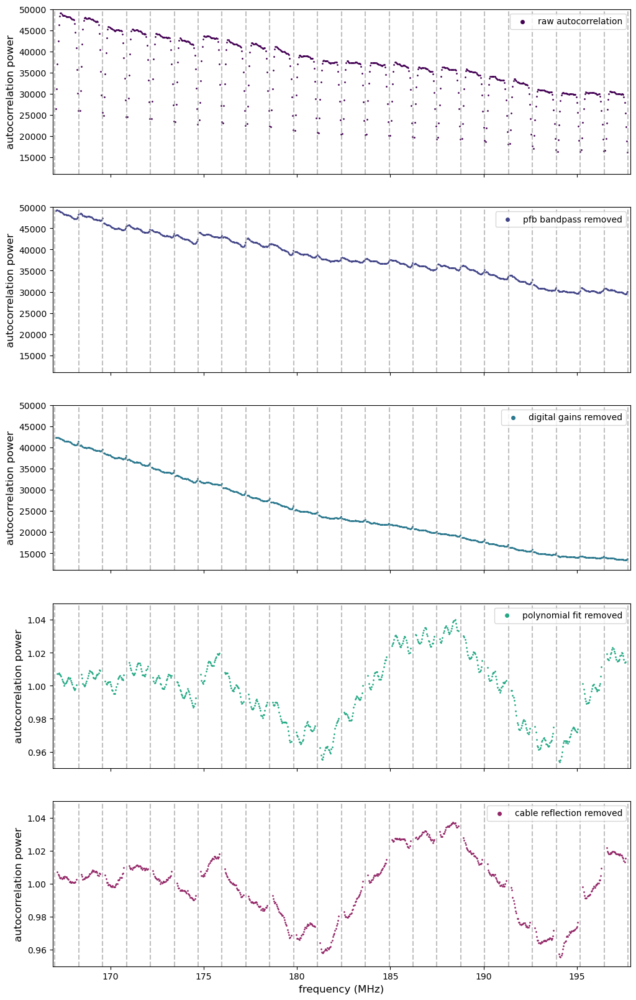

In [170]:
freq_mask = np.full(32, True)
freq_mask[0] = False
freq_mask_full = np.tile(freq_mask, 24)

gain_jump_freqs = freqs - 0.02
gain_jump_freqs = np.concatenate((gain_jump_freqs, np.array([freqs[-1] + 0.02])))
gain_jump_freqs = gain_jump_freqs[0::32]
gains = np.repeat(meta2["gains"][9, :], 32)

fig, axes = plt.subplots(nrows=5, figsize=(12, 20))
ymin, ymax = 11000, 50000

ax = axes[0]
ax.vlines(gain_jump_freqs, ymin, ymax, linestyle="--", color='grey', alpha=0.5)
ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
ax.set_ylim(ymin, ymax)
ax.tick_params(labelbottom=False)
ax.scatter(freqs[freq_mask_full], raw.real[8, :, 0][freq_mask_full], s=1, label='raw autocorrelation', color=my_colors2[0])
ax.legend(markerscale=4, loc='upper right')
ax.set_ylabel('autocorrelation power', fontsize=12)

ax = axes[1]
ax.vlines(gain_jump_freqs, ymin, ymax, linestyle="--", color='grey', alpha=0.5)
ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
ax.set_ylim(ymin, ymax)
ax.tick_params(labelbottom=False)
ax.scatter(freqs[freq_mask_full], pfb_only.real[8, :, 0][freq_mask_full], s=1, label='pfb bandpass removed', color=my_colors2[1])
ax.legend(markerscale=4, loc='upper right')
ax.set_ylabel('autocorrelation power', fontsize=12)

ax = axes[2]
ax.vlines(gain_jump_freqs, ymin, ymax, linestyle="--", color='grey', alpha=0.5)
ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
ax.set_ylim(ymin, ymax)
ax.tick_params(labelbottom=False)
ax.scatter(freqs[freq_mask_full], uv2.data_array.real[8, :, 0][freq_mask_full], s=1, label='digital gains removed', color=my_colors2[2])
# ax2 = ax.twinx()
# ax2.plot(freqs, gains, color='grey', alpha=0.5, label='digital gain magnitude')
# ax2.set_ylabel('digital gain magnitude', fontsize=12)
# ax.set_ylabel('autocorrelation power', fontsize=12)
# lines, labels = ax.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax2.legend(lines + lines2, labels + labels2, markerscale=2, loc='center right')
ax.legend(markerscale=4, loc='upper right')
ax.set_ylabel('autocorrelation power', fontsize=12)

freq_mask[[1, 2, 29, 30, 31]] = False
freq_mask_full = np.tile(freq_mask, 24)

ymin, ymax = 0.95, 1.05
ax = axes[3]
ax.vlines(gain_jump_freqs, ymin, ymax, linestyle="--", color='grey', alpha=0.5)
ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
ax.set_ylim(ymin, ymax)
ax.tick_params(labelbottom=False)
ax.scatter(freqs[freq_mask_full], poly_xx[8, :][freq_mask_full], s=1, label='polynomial fit removed', color=my_colors2[3])
ax.legend(markerscale=4, loc='upper right')
ax.set_ylabel('autocorrelation power', fontsize=12)

ax = axes[4]
ax.vlines(gain_jump_freqs, ymin, ymax, linestyle="--", color='grey', alpha=0.5)
ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
ax.set_ylim(ymin, ymax)
ax.set_xlabel("frequency (MHz)", fontsize=12)
ax.scatter(freqs[freq_mask_full], cab_2[8, :, 0][freq_mask_full], s=1, label='cable reflection removed', color=my_colors1[2])
ax.legend(markerscale=4, loc='upper right')
ax.set_ylabel('autocorrelation power', fontsize=12)
fig.savefig('/Users/pstar/EORanalysis/thesis_plots/auto_correct.pdf')

plt.show()
plt.close()

In [ ]:
init_delays2 = meta2['cable_delays'][np.isin(meta2['ant_nums'], uv2.ant_1_array)]
cable2 = ut.fit_cable_reflections(uv2, uv2.data_array, init_delays2)

approximate tau: 1.2440755208333334
approximate amplitude: 0.008879490084100852
approximate phase: -0.5782974975248126
initial index of tau: 58
initial approximate phase: -2.3195115734670404
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.004014314008656178
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.883544921875
approximate amplitude: 0.001685504802515181
approximate phase: 0.6760292427301615
initial index of tau: 58
initial approximate phase: -2.26353987400021
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.0028137293818230294
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.883740234375
approximate amplitude: 0.0009411074086561034
approximate phase: -0.6011880642714829
initial index of tau: 58
initial approximate phase: 3.0537268696098674
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.002172604520111859
hyperfine delay r

approximate tau: 0.68359375
approximate amplitude: 0.02662389010965298
approximate phase: 5.9794563754769765
initial index of tau: 77
initial approximate phase: -0.9096017597737471
initial approximate tau: 2.506510416666667
initial approximate amplitude: 0.002217891496290224
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 2.556982421875
approximate amplitude: 0.0027280187342509665
approximate phase: -2.1403357341666207
initial index of tau: 77
initial approximate phase: -0.934374353131663
initial approximate tau: 2.506510416666667
initial approximate amplitude: 0.001855874098585224
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 2.556038411458333
approximate amplitude: 0.003003206184917878
approximate phase: -0.6895241694643754
initial index of tau: 77
initial approximate phase: 2.4488726736774518
initial approximate tau: 2.506510416666667
initial approximate amplitude: 0.003367555484965375
hyperfine delay resolution

approximate tau: 1.8687174479166668
approximate amplitude: 0.012583978216850639
approximate phase: -1.754551244706778
initial index of tau: 58
initial approximate phase: -2.2263803785583187
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.003471473064427595
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.8941406250000001
approximate amplitude: 0.0012849154418265699
approximate phase: 0.5587862091372046
initial index of tau: 58
initial approximate phase: -2.8752297607570387
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.00439528342206945
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.8827473958333334
approximate amplitude: 0.0018208863356510272
approximate phase: -3.1788368539705414
initial index of tau: 58
initial approximate phase: 1.1463821491730606
initial approximate tau: 1.8880208333333335
initial approximate amplitude: 0.010720191202811357
hyperfine

approximate tau: 1.2503092447916666
approximate amplitude: 0.005480416083639499
approximate phase: -0.9281798390565706
initial index of tau: 38
initial approximate phase: -0.3511663217160404
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008957070784946236
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2497721354166667
approximate amplitude: 0.008460490563286885
approximate phase: -2.0000394655191944
initial index of tau: 38
initial approximate phase: 0.9011996585092967
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0026748939959926428
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2470703125
approximate amplitude: 0.006261128308791983
approximate phase: -0.6287782029541509
initial index of tau: 38
initial approximate phase: 1.5211264038504315
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008103789614192447
hyperfine dela

approximate tau: 1.2291178385416668
approximate amplitude: 0.02421089417245716
approximate phase: 2.0517964284846233
initial index of tau: 38
initial approximate phase: -1.8232902860198175
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.007981283756170776
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2478841145833333
approximate amplitude: 0.007712298007707867
approximate phase: -3.8289547608757952
initial index of tau: 38
initial approximate phase: -0.7704621453635266
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.00822808783115163
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2491536458333334
approximate amplitude: 0.006160955621993322
approximate phase: -0.6428257160496834
initial index of tau: 38
initial approximate phase: -2.570985625170011
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0007584439510172215
hyperfine 

approximate tau: 0.810107421875
approximate amplitude: 0.005115215278249654
approximate phase: -2.0721431488483866
initial index of tau: 38
initial approximate phase: -3.076963812960972
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0020888270930331963
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.244873046875
approximate amplitude: 0.006666369976924373
approximate phase: -5.323084566966787
initial index of tau: 38
initial approximate phase: -2.8216996475444263
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.004780463292211138
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2479166666666668
approximate amplitude: 0.009577741485208667
approximate phase: -2.7602575213813534
initial index of tau: 38
initial approximate phase: 1.0341938836800333
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.003411207180847871
hyperfine delay r

approximate tau: 1.2513671875
approximate amplitude: 0.0105540766069028
approximate phase: 2.011528131331715
initial index of tau: 38
initial approximate phase: 0.7554556795921313
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.003402826840197461
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.24736328125
approximate amplitude: 0.005994103648028577
approximate phase: -0.7878373156293015
initial index of tau: 38
initial approximate phase: -2.2456710038698846
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.003629764660756308
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2500651041666666
approximate amplitude: 0.0062659077754256
approximate phase: 0.7414024493026471
initial index of tau: 38
initial approximate phase: -0.6193170788280943
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0022739366939916773
hyperfine delay resolutio

approximate tau: 1.3020670572916666
approximate amplitude: 0.0076870746319136225
approximate phase: 1.6303621698148039
initial index of tau: 38
initial approximate phase: 0.09250476995798465
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0057621793511869164
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.250048828125
approximate amplitude: 0.006992462258018799
approximate phase: 3.130361280968985
initial index of tau: 38
initial approximate phase: -0.485273664309977
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.009326501115250116
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2483561197916666
approximate amplitude: 0.008254435476377964
approximate phase: -0.16726514068288686
initial index of tau: 38
initial approximate phase: 2.6117289073671914
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008501727718943631
hyperfine del

approximate tau: 1.253271484375
approximate amplitude: 0.028553909602468754
approximate phase: 0.05565723863208664
initial index of tau: 38
initial approximate phase: -1.8439203133003013
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.007225716034751338
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2238444010416667
approximate amplitude: 0.008173734874715963
approximate phase: -1.5807435900723277
initial index of tau: 38
initial approximate phase: 0.5058403743072105
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.00622153923814384
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2211100260416667
approximate amplitude: 0.010808828782435321
approximate phase: -1.9765175102863795
initial index of tau: 38
initial approximate phase: -0.7471661032131146
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.010018627462817075
hyperfine del

approximate tau: 1.2748372395833334
approximate amplitude: 0.013594795508055457
approximate phase: -0.9978455292630412
initial index of tau: 38
initial approximate phase: 0.25761813790676125
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.007165952635063291
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.248193359375
approximate amplitude: 0.00868329001997693
approximate phase: -1.0217721546611163
initial index of tau: 38
initial approximate phase: -1.068116504082901
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008919403735331103
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2494303385416667
approximate amplitude: 0.007076662348759698
approximate phase: -0.4233694282091711
initial index of tau: 38
initial approximate phase: 2.2637448241666167
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.006768849484293159
hyperfine dela

approximate tau: 1.2445149739583334
approximate amplitude: 0.004320756296660669
approximate phase: 0.029357894209348222
initial index of tau: 38
initial approximate phase: -2.3277760559810248
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.004568505041822684
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.245947265625
approximate amplitude: 0.006088670148622913
approximate phase: -0.9549026623995208
initial index of tau: 38
initial approximate phase: -0.6584333206656042
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.010719157480137461
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2442057291666666
approximate amplitude: 0.008350077149943331
approximate phase: -1.4249737935956095
initial index of tau: 38
initial approximate phase: 2.73454034431721
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.006796597371555591
hyperfine del

approximate tau: 0.7501953125
approximate amplitude: 0.00435719018211553
approximate phase: -2.2221101528428746
initial index of tau: 38
initial approximate phase: 0.7887046007691781
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.002121405820744298
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2516764322916667
approximate amplitude: 0.006645536207352615
approximate phase: 0.3162082429480625
initial index of tau: 38
initial approximate phase: -1.5125117387473472
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008281016823688285
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2514811197916667
approximate amplitude: 0.007990217021567084
approximate phase: -2.0400879631299875
initial index of tau: 38
initial approximate phase: 2.5497553848567063
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.011495107830312825
hyperfine delay r

approximate tau: 1.2472981770833333
approximate amplitude: 0.0135191842243485
approximate phase: 5.03822011028986
initial index of tau: 38
initial approximate phase: -0.9073977435185523
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.007824483515801714
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2450032552083334
approximate amplitude: 0.0050952347082256835
approximate phase: -2.008703414997981
initial index of tau: 38
initial approximate phase: -1.6732324848037143
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.008036580909587464
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2462727864583334
approximate amplitude: 0.007177590095876809
approximate phase: -2.1736853906271625
initial index of tau: 38
initial approximate phase: 2.0835361607149667
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.005232702252260888
hyperfine del

approximate tau: 1.208642578125
approximate amplitude: 0.1736703258817366
approximate phase: -2.5726674959010847
initial index of tau: 38
initial approximate phase: -0.7626339603922767
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.010700795096920807
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2437174479166666
approximate amplitude: 0.008033627914159203
approximate phase: -0.7163088045068725
initial index of tau: 38
initial approximate phase: -0.8885846417778276
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.01153356199255081
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.24453125
approximate amplitude: 0.008792087754380205
approximate phase: -1.424906439113017
initial index of tau: 38
initial approximate phase: 2.3160370050184063
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.01399691113378197
hyperfine delay resolutio

approximate tau: 1.2444986979166668
approximate amplitude: 0.007068638088851242
approximate phase: 0.040983815262896975
initial index of tau: 38
initial approximate phase: -2.0151372775026455
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.007053827554339922
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2454752604166668
approximate amplitude: 0.007683271991589492
approximate phase: -0.7760598115380851
initial index of tau: 38
initial approximate phase: -2.8299139077822626
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.0036934480233207024
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 1.2465657552083333
approximate amplitude: 0.007771643866901459
approximate phase: -1.1941759743538938
initial index of tau: 38
initial approximate phase: 1.6839439515396466
initial approximate tau: 1.2369791666666667
initial approximate amplitude: 0.006328667669157031
hyperf

In [ ]:
cab_dat2, ref2 = ut.apply_cable_reflections(uv2, uv2.data_array, cable2)

In [ ]:
z = np.polynomial.polynomial.polyfit(freqs[::13], cab_dat2.real[i, ::13, 0].flatten(), 3)
q = np.polynomial.polynomial.polyval(freqs, z)

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
ax.plot(freqs, q)
ax.plot(freqs, cab_dat2.real[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
l_init_delays = np.full(uv2.Nants_data, 0.08)
cablel2 = ut.fit_cable_reflections(uv2, cab_dat2, l_init_delays, polyfit = False)

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -31.415999398881663
initial index of tau: 2
initial approximate phase: 0.6877875818033697
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.07774572136155193
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -6.283435018212848
initial index of tau: 2
initial approximate phase: -2.574422179444719
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.1402707256671266
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0000000000000002
approximate phase: -72.25680565287533
initial index of tau: 2
initial approximate phase: -2.574422179444719
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.1402707256671266
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -122.52217957917657
initial index of tau: 2
initial approximate phase: -2.4277032254135564
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.10928886211698295
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -122.52217957917657
initial index of tau: 2
initial approximate phase: 0.8095775735760771
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.03654046857887637
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -18.849558476317377
initial index of tau: 2
initial approximate phase: 0.7205178084200465
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.045752286875947394
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitud

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: 0.00012085614578190296
initial index of tau: 2
initial approximate phase: 0.3829171530239743
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06844640972453415
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -18.849555738694086
initial index of tau: 2
initial approximate phase: -2.9161810758273314
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.12250244031503721
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -3.1414614409246484
initial index of tau: 2
initial approximate phase: -2.9161810758273314
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.12250244031503721
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate ampli

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -147.6549108374499
initial index of tau: 2
initial approximate phase: -2.543443468527167
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.08926055657045036
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -147.6549108374499
initial index of tau: 2
initial approximate phase: 0.5637229115740612
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06484590494952376
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0000000000000002
approximate phase: -18.8497070980539
initial index of tau: 2
initial approximate phase: 0.5463329071819794
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06109203013386146
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -100.530808124361
initial index of tau: 2
initial approximate phase: 0.6152341243727132
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06671712107825171
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -6.283184300257766
initial index of tau: 2
initial approximate phase: -2.074230145246125
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.12300049125406455
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -260.75235751112933
initial index of tau: 2
initial approximate phase: -2.074230145246125
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.12300049125406455
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -0.00021306293148323774
initial index of tau: 2
initial approximate phase: 0.45921916263823986
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.07119860577353736
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -0.00021306293148323774
initial index of tau: 2
initial approximate phase: 0.5325376361200039
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06083671975812113
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: 0.0021952186908267557
initial index of tau: 2
initial approximate phase: 0.5743087999744463
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06243565771985081
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -56.54946981295018
initial index of tau: 2
initial approximate phase: 0.5027227401774125
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06571599236142552
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -50.26410206034323
initial index of tau: 2
initial approximate phase: -2.7558134115309345
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.0995330118871933
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -34.556252877124955
initial index of tau: 2
initial approximate phase: -2.7558134115309345
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.0995330118871933
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1

approximate tau: 0.0
approximate amplitude: 0.9999854263700616
approximate phase: -273.3185930239211
initial index of tau: 2
initial approximate phase: -2.7041750327487097
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.19724060053805795
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 0.9999854263700616
approximate phase: -273.3185930239211
initial index of tau: 2
initial approximate phase: 0.43874941605981216
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06592932981720538
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -0.00043740200332442747
initial index of tau: 2
initial approximate phase: 0.43610732995291474
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06802525485192902
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approxim

approximate tau: 0.0
approximate amplitude: 0.9999999999999999
approximate phase: -18.849701175371887
initial index of tau: 2
initial approximate phase: 0.6104635497799329
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.05922606120283913
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -12.566211072181801
initial index of tau: 2
initial approximate phase: -2.728009047419424
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.09184538491988029
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 0.9999999999999999
approximate phase: -3.1407654672538965
initial index of tau: 2
initial approximate phase: -2.728009047419424
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.09184538491988029
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate t

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: 135.08848363578625
initial index of tau: 2
initial approximate phase: 1.2660564842137203
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.050138643644139315
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: 135.08848363578625
initial index of tau: 2
initial approximate phase: 0.549877062658945
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.0659391141562193
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -12.566308023594072
initial index of tau: 2
initial approximate phase: 0.4725421497999288
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06689496414017838
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -18.849578396980146
initial index of tau: 2
initial approximate phase: 0.506314094214449
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.06470583925854181
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -69.11587713659455
initial index of tau: 2
initial approximate phase: -2.8442767769650272
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.2250855342446985
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 0.9999977121770478
approximate phase: -3.141272774901514
initial index of tau: 2
initial approximate phase: -2.8442767769650272
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.2250855342446985
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximat

approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -15.707761917281134
initial index of tau: 2
initial approximate phase: -2.928599790688394
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.09507263249101185
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: -15.707761917281134
initial index of tau: 2
initial approximate phase: 0.3593464278374305
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.0746260720019101
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitude: 1.0
approximate phase: 0.00045072015414979183
initial index of tau: 2
initial approximate phase: 0.36934327392187816
initial approximate tau: 0.06510416666666667
initial approximate amplitude: 0.07062655852772624
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.0
approximate amplitu

In [ ]:
cab_datl2, refl2 = ut.apply_cable_reflections(uv2, cab_dat2, cablel2,)

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
# ax.plot(freqs, q)
# ax.plot(freqs, uv2.data_array[i, :, 0].flatten())
#ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
ax.plot(freqs, ref2[i, :, 0].flatten() / q)
# ax.plot(freqs, .06 * np.sin(freqs*.5) + 1.01)
# ax.plot(freqs, cab_datl2.real[i, :, 0].flatten() / (q * (.06 * np.sin(freqs*.5) + 1.01)))
#ax.plot(freqs, ref2[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
dv = uv2.channel_width[0] / 1e6
v = uv2.freq_array / 1e6
N = uv2.Nfreqs
dt = 1 / (N * dv)
print("delay resolution (microseconds): " + str(dt))
amp = dv * N
delay_array = np.arange(0, N * dt, dt)

data_delay = np.fft.ifft(cab_dat2.real[i, :, 0].flatten() / q)

data_delay = data_delay * amp * np.exp(1j * v[0] * 2 * np.pi * delay_array)


data_delay = data_delay[0 : int(N / 2)]
delay_array = delay_array[0 : int(N / 2)]
high_ind = np.where(data_delay[1:50] == np.max(data_delay[1:50]))[0][0] + 1
print(high_ind)
print(np.max(delay_array[1:50]))
tau0 = delay_array[high_ind]
amp0 = np.abs(data_delay[high_ind]) / np.abs(data_delay[0])
phase0 = np.angle(data_delay[high_ind])
print(delay_array[high_ind])
print(tau0)
print(amp0)
print(phase0)
print(dt/2000)
window = signal.blackmanharris(N)
kappa = np.arange(high_ind - 2, high_ind + 2, 0.0005)
kappa = kappa[:, np.newaxis]
k = np.arange(N)
hyperfine_delay = (
    (cab_dat2.real[i, :, 0].flatten() / q)
    * window
    * np.exp(-1j * 2 * np.pi * kappa * k / N)
)
print(hyperfine_delay.shape)
hyperfine_delay = np.sum(hyperfine_delay, axis=-1)
print(hyperfine_delay.shape)
delay_ind = np.where(
    np.abs(hyperfine_delay) == np.max(np.abs(hyperfine_delay))
)[0][0]
print(delay_ind)
print(delay_ind)
print(np.abs(hyperfine_delay[delay_ind]))
print(np.max(np.abs(hyperfine_delay)))
tau1 = delay_array[high_ind - 2] + dt * delay_ind / 2000
print("approximate tau: " + str(tau1))

amp1 = np.abs(hyperfine_delay)[delay_ind] / np.sum(
    np.abs(cab_dat2.real[i, :, 0].flatten() / q) * window
)
print("approximate amplitude: " + str(amp1))
#def f(bp, phi):
#    return (
#        1 + (amp1 ** 2) + 2 * amp1 * np.cos(2 * np.pi * tau1 * bp + phi)
#    )
def f(bp, phi):
    return (
        1 + (amp1 ** 2) + amp1 * np.cos(2 * np.pi * tau1 * bp + phi)
    )
popt, pcov = curve_fit(f, v, (cab_dat2.real[i, :, 0].flatten() / q), p0=phase0)
phase1 = popt[0]
print("approximate phase: " + str(phase1))
reflection_term = 1 + (amp1 ** 2) + amp1 * np.cos(2 * np.pi * tau1 * v + phase1)

In [ ]:
hyperfine_delay.shape

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
# ax.plot(freqs, q)
# ax.plot(freqs, uv2.data_array[i, :, 0].flatten())
#ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
ax.plot(kappa.flatten(), np.abs(hyperfine_delay.flatten()))
#ax.plot(freqs, .06 * np.sin(freqs*.5) + 1.01)
#ax.plot(freqs, cab_datl2.real[i, :, 0].flatten() / (q * (.04 * np.sin(freqs*.6) + 1.01)))
#ax.plot(freqs, ref2[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
# ax.plot(freqs, q)
# ax.plot(freqs, uv2.data_array[i, :, 0].flatten())
#ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
ax.plot(delay_array[1:50], np.abs(data_delay)[1:50])
#ax.plot(freqs, .06 * np.sin(freqs*.5) + 1.01)
#ax.plot(freqs, cab_datl2.real[i, :, 0].flatten() / (q * (.04 * np.sin(freqs*.6) + 1.01)))
#ax.plot(freqs, ref2[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
z = np.polynomial.polynomial.polyfit(freqs[::13], cab_dat2.real[i, ::13, 0].flatten(), 3)
q = np.polynomial.polynomial.polyval(freqs, z)
# ax.plot(freqs, q)
# ax.plot(freqs, uv2.data_array[i, :, 0].flatten())
#ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
ax.plot(freqs, cab_dat2.real[i, :, 0].flatten() / q)
amp0 = .055
tau0 = 0.07
phase0 = 2.9
def f(bp, amp, tau, phi):
    return (
        1 + (amp ** 2) + amp * np.cos(2 * np.pi * tau * bp + phi)
    )
popt, pcov = curve_fit(f, freqs, (cab_dat2.real[i, :, 0].flatten() / q), p0=[amp0,tau0,phase0])
print(popt)
amp1 = popt[0]
tau1 = popt[1]
phase1 = popt[2]
reflection_term = 1 + (amp1 ** 2) + amp1 * np.cos(2 * np.pi * tau1 * v + phase1)
ax.plot(freqs, reflection_term)
ax.plot(freqs, cab_dat2.real[i,:, 0].flatten()/ (q * reflection_term))
#ax.plot(freqs, .06 * np.sin(freqs*.5) + 1.01)
#ax.plot(freqs, cab_datl2.real[i, :, 0].flatten() / (q * (.04 * np.sin(freqs*.6) + 1.01)))
#ax.plot(freqs, ref2[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where(uv2.ant_1_array == 1057)
# ax.plot(freqs, q)
# ax.plot(freqs, uv2.data_array[i, :, 0].flatten())
#ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
# ax.plot(freqs, cab_dat2.real[i, :, 0].flatten() / q)
# ax.plot(freqs, .06 * np.sin(freqs*.5) + 1.01)
ax.plot(freqs, cab_dat2.real[i, :, 0].flatten() / (q * reflection_term))
ax.set_xlabel('frequency (MHz)', fontsize=12)
ax.set_ylabel('residual bandpass', fontsize=12)
fig.savefig('/Users/pstar/EORanalysis/mwax_plots/prop_fig_2023.pdf')
#ax.plot(freqs, ref2[i, :, 0].flatten())
plt.show()
plt.close()

In [ ]:
for ant in np.unique(uv2.ant_1_array):
    i = np.where(uv2.ant_1_array == ant)[0]
    z = np.polynomial.polynomial.polyfit(freqs[::13], uv2.data_array.real[i, ::13, 0].flatten(), 7)
    q = np.polynomial.polynomial.polyval(freqs, z)
    fig, ax = plt.subplots(figsize = (12,4))
    ax.plot(freqs, uv2.data_array.real[i, :, 0].flatten() / q)
    plt.show()
    plt.close()

In [ ]:
for ant in np.unique(uv2.ant_1_array):
    i = np.where(uv2.ant_1_array == ant)[0]
    z = np.polynomial.polynomial.polyfit(freqs[::13], uv2.data_array.real[i, ::13, 0].flatten(), 3)
    q = np.polynomial.polynomial.polyval(freqs, z)
    fig, ax = plt.subplots(figsize = (12,4))
    ax.plot(freqs, cab_dat2.real[i, :, 0].flatten() / q)
    plt.show()
    plt.close()

In [ ]:
uv1.data_array.shape

In [ ]:
# test delay spectrum code
uv1_delay = ut.compute_delay_spectra(uv1, uv1.data_array.real, 'uv1')

In [58]:
# subtract off second-order polynomial
res_xx1, res_yy1 = poly(uv1, uv1.data_array, 3)
res_xx2, res_yy2 = poly(uv2, uv2.data_array, 3)
res_xx3, res_yy3 = poly(uv3, uv3.data_array, 3)
res_xx4, res_yy4 = poly(uv4, uv4.data_array, 3)
res_xx5, res_yy5 = poly(uv5, uv5.data_array, 3)

In [59]:
edge_mask = np.full(28, True)
edge_mask = np.concatenate((np.array([False, False]), edge_mask))
edge_mask = np.concatenate((edge_mask, np.array([False, False])))
edge_mask = np.tile(edge_mask, 24)

In [60]:
# freq_res_xx, freq_res_yy = poly(uv1, freq_gains, 3)

In [61]:
# make individual plots for each res (these will have mean power)
# make plots with all res together (with offsets)

In [62]:
meta1.keys()

dict_keys(['ant_nums', 'cable_flavors', 'gains', 'cable_delays', 'recs', 'ant_names'])

In [63]:
meta1["ant_nums"]

array([  11,   12,   13,   14,   15,   16,   17,   18,   21,   22,   23,
         24,   25,   26,   27,   28,   31,   32,   33,   34,   35,   36,
         37,   38,   41,   42,   43,   44,   45,   46,   47,   48,   61,
         62,   63,   64,   65,   66,   67,   68,   81,   82,   83,   84,
         85,   86,   87,   88,   91,   92,   93,   94,   95,   96,   97,
         98, 1001, 1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010,
       1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021,
       1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032,
       1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043,
       1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054,
       1055, 1056, 1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065,
       1066, 1067, 1068, 1069, 1070, 1071, 1072], dtype='>i2')

In [64]:
uv1.ant_1_array

array([  11,   12,   13,   14,   16,   17,   18,   21,   22,   23,   24,
         25,   26,   27,   28,   31,   32,   33,   34,   35,   36,   37,
         38,   41,   42,   43,   44,   45,   46,   47,   48,   61,   62,
         63,   64,   65,   66,   67,   68,   81,   82,   83,   84,   85,
         86,   87,   88,   91,   93,   94,   95,   96,   97,   98, 1001,
       1002, 1003, 1004, 1005, 1006, 1007, 1008, 1009, 1010, 1011, 1012,
       1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023,
       1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034,
       1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045,
       1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1056,
       1057, 1058, 1059, 1060, 1061, 1062, 1063, 1064, 1065, 1066, 1067,
       1068, 1069, 1070, 1071, 1072], dtype=uint64)

In [65]:
uv1.freq_array.shape

(768,)

In [66]:
uv1.extra_keywords.keys()

dict_keys(['U2S_VER', 'CBF_VER', 'DB2F_VER', 'GPSTIME', 'EXPOSURE', 'MJD', 'LST', 'HA', 'AZIMUTH', 'ALTITUDE', 'RA', 'DEC', 'RAPHASE', 'DECPHASE', 'DELAYMOD', 'CABLEDEL', 'GEODEL', 'CALIBDEL', 'DELDESC', 'ATTEN_DB', 'SUN-DIST', 'MOONDIST', 'JUP-DIST', 'GRIDNAME', 'GRIDNUM', 'CREATOR', 'PROJECT', 'MODE', 'RECVRS', 'DELAYS', 'CALIBRAT', 'CENTCHAN', 'CHANNELS', 'CHANSEL', 'SUN-ALT', 'INTTIME', 'NAV_FREQ', 'NSCANS', 'NINPUTS', 'NCHANS', 'BANDWDTH', 'FREQCENT', 'TIMEOFF', 'DATESTRT', 'RAWSCALE', 'VERSION', 'QUACKTIM', 'GOODTIME', 'DATE', 'COMMENT'])

In [67]:
uv1.extra_keywords["GPSTIME"]

1321443424

In [68]:
gain_jump_freqs = freqs - 0.02
gain_jump_freqs = np.concatenate((gain_jump_freqs, np.array([freqs[-1] + 0.02])))
gain_jump_freqs = gain_jump_freqs[0::32]
print(gain_jump_freqs)

[167.02 168.3  169.58 170.86 172.14 173.42 174.7  175.98 177.26 178.54
 179.82 181.1  182.38 183.66 184.94 186.22 187.5  188.78 190.06 191.34
 192.62 193.9  195.18 196.46 197.74]


In [69]:
def plot_residuals(uv, resx, resy, meta):
    freqs = uv.freq_array[:] / 1e6
    for i in range(uv.Nants_data):
        ant_num = uv.ant_1_array[i]
        ind = np.where(meta["ant_nums"] == ant_num)[0][0]
        flavor = meta["cable_flavors"][ind]
        gains = np.repeat(meta["gains"][ind, :], 32)
        gain_jump_freqs = freqs - 0.02
        gain_jump_freqs = np.concatenate((gain_jump_freqs, np.array([freqs[-1] + 0.02])))
        gain_jump_freqs = gain_jump_freqs[0::32]
        obs = str(uv.extra_keywords["GPSTIME"])
        fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
        ax = axes[0]

        mean_pow = np.round(np.mean(uv.data_array.real[i, :, 0]), 0)
        masked_data = np.copy(resx[i, :])
        masked_data[~edge_mask] = np.nan
        ax.plot(freqs, masked_data)

        ymin, ymax = .9, 1.1
        ax.set_ylim(ymin, ymax)
        # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
        ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
        ax2 = ax.twinx()
        ax2.plot(freqs, gains, color='grey', alpha=0.5)
        ax.set_title(obs + ' 40 kHz; antenna ' + str(ant_num) + '\n flavor: ' + str(flavor))
        
        ax = axes[1]

        mean_pow = np.round(np.mean(uv.data_array.real[i, :, 0]), 0)
        masked_data = np.copy(resy[i, :])
        masked_data[~edge_mask] = np.nan
        ax.plot(freqs, masked_data)
        
        ymin, ymax = .9, 1.1
        ax.set_ylim(ymin, ymax)
        # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
        ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
        ax2 = ax.twinx()
        ax2.plot(freqs, gains, color='grey', alpha=0.5)
        fig.savefig('/Users/pstar/EORanalysis/mwax_plots/pfb_autos/' + obs + '/' + obs + '_40_poly_res_masked' + str(ant_num) + '.png')
        plt.show()
        plt.close()

In [ ]:
plot_residuals(uv1, res_xx1, res_yy1, meta1)
plot_residuals(uv2, res_xx2, res_yy2, meta2)
plot_residuals(uv3, res_xx3, res_yy3, meta3)
plot_residuals(uv4, res_xx4, res_yy4, meta4)

In [ ]:
fig, ax = plt.subplots(figsize = (12,4))
ant_num = 1057
i = np.where()
flavor = meta1["cable_flavors"][ind]
gains = np.repeat(meta1["gains"][ind, :], 32)
ax.plot(res_xx2[])

In [ ]:
freqs = uv1.freq_array[:] / 1e6
for i in range(uv1.Nants_data):
    ant_num = uv1.ant_1_array[i]
    ind = np.where(meta1["ant_nums"] == ant_num)[0][0]
    flavor = meta1["cable_flavors"][ind]
    gains = np.repeat(meta1["gains"][ind, :], 32)
    gain_jump_freqs = freqs[1:][np.abs(np.diff(gains)) > 0]
    fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
    ax = axes[0]
    
    # mean_pow = np.round(np.mean(av_data_xx_40[i, :]), 0)
    masked_data = np.copy(res_xx1[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data + .05, color=my_colors[1], label='minus one')
    
    masked_data = np.copy(res_xx2[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data, color=my_colors[2], label='zenith')
    
    masked_data = np.copy(res_xx3[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data - .05, color=my_colors[3], label='plus one')
    
    masked_data = np.copy(res_xx4[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data - .1, color=my_colors[4], label='plus two')
    
    # ymin, ymax = ax.get_ylim()
    ymin, ymax = .8, 1.2
    ax.set_ylim(ymin, ymax)
    ax.legend()
    # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
    ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
    ax2 = ax.twinx()
    ax2.plot(freqs, gains, color='grey', alpha=0.5)
    ax.set_title('mwax night 1; antenna ' + str(ant_num) + '\n flavor: ' + str(flavor))
    ax = axes[1]
    # masked_data = np.copy(av_data_yy_40[i, :])
    # masked_data[~edge_mask] = np.nan
    # ax.plot(freqs, masked_data)
    # mean_pow = np.round(np.mean(av_data_yy_40[i, :]), 0)
    masked_data = np.copy(res_yy1[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data + .05, color=my_colors[1], label='minus one')
    
    masked_data = np.copy(res_yy2[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data, color=my_colors[2], label='zenith')
    
    masked_data = np.copy(res_yy3[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data - .05, color=my_colors[3], label='plus one')
    
    masked_data = np.copy(res_yy4[i, :])
    masked_data[~edge_mask] = np.nan
    ax.plot(freqs, masked_data - .1, color=my_colors[4], label='plus two')
    # ymin, ymax = ax.get_ylim()
    ymin, ymax = .8, 1.2
    ax.set_ylim(ymin, ymax)
    ax.legend()
    # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
    ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
    ax2 = ax.twinx()
    ax2.plot(freqs, gains, color='grey', alpha=0.5)
    fig.savefig('/Users/pstar/EORanalysis/mwax_plots/pfb_autos/mwax_1_golden/each_pointing_40_poly_res_masked' + str(ant_num) + '.png')
    plt.show()
    plt.close()

In [70]:
init_delays1 = meta1['cable_delays'][np.isin(meta1['ant_nums'], uv1.ant_1_array)]
init_delays2 = meta2['cable_delays'][np.isin(meta2['ant_nums'], uv2.ant_1_array)]
init_delays3 = meta3['cable_delays'][np.isin(meta3['ant_nums'], uv3.ant_1_array)]
init_delays4 = meta4['cable_delays'][np.isin(meta4['ant_nums'], uv4.ant_1_array)]
init_delays5 = meta5['cable_delays'][np.isin(meta5['ant_nums'], uv5.ant_1_array)]

In [71]:
data1 = np.array([res_xx1.T, res_yy1.T]).T
data2 = np.array([res_xx2.T, res_yy2.T]).T
data3 = np.array([res_xx3.T, res_yy3.T]).T
data4 = np.array([res_xx4.T, res_yy4.T]).T
data5 = np.array([res_xx5.T, res_yy5.T]).T

In [72]:
# cable1 = ut.fit_cable_reflections(uv1, uv1.data_array, init_delays1)
# cable2 = ut.fit_cable_reflections(uv2, uv2.data_array, init_delays2)
# cable3 = ut.fit_cable_reflections(uv3, uv3.data_array, init_delays3)
# cable4 = ut.fit_cable_reflections(uv4, uv4.data_array, init_delays4)

In [73]:
cable1 = ut.fit_cable_reflections(uv1, data1, init_delays1, polyfit=False)
cable2 = ut.fit_cable_reflections(uv2, data2, init_delays2, polyfit=False)
cable3 = ut.fit_cable_reflections(uv3, data3, init_delays3, polyfit=False)
cable4 = ut.fit_cable_reflections(uv4, data4, init_delays4, polyfit=False)
cable5 = ut.fit_cable_reflections(uv5, data5, init_delays5, polyfit=False)

delay resolution (microseconds): 0.032552083333333336
initial index of tau: 23
initial approximate phase: -1.9459625267070961
initial approximate tau: 0.7486979166666667
initial approximate amplitude: 0.006956067178512822
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.757763671875
approximate amplitude: 0.008242858320972376
approximate phase: -2.210207220223592
[ 0.75776367  0.00824286 -2.21020722]
0.757763671875 0.008242858320972376 -2.210207220223592
initial index of tau: 23
initial approximate phase: -1.5852132887986732
initial approximate tau: 0.7486979166666667
initial approximate amplitude: 0.006398019190484215
hyperfine delay resolution (microseconds): 1.6276041666666666e-05
approximate tau: 0.756103515625
approximate amplitude: 0.006997649878646848
approximate phase: -0.6850881265449662
initial index of tau: 23
initial approximate phase: -2.7840728415418488
initial approximate tau: 0.7486979166666667
initial approximate amplitude: 0.0069434

In [74]:
cab_dat1, ref1 = ut.apply_cable_reflections(uv1, data1, cable1[..., :2])
cab_dat2, ref2 = ut.apply_cable_reflections(uv2, data2, cable2[..., :2])
cab_dat3, ref3 = ut.apply_cable_reflections(uv3, data3, cable3[..., :2])
cab_dat4, ref4 = ut.apply_cable_reflections(uv4, data4, cable4[..., :2])
cab_dat5, ref5 = ut.apply_cable_reflections(uv5, data5, cable5[..., :2])

In [ ]:
cab_dat1.shape

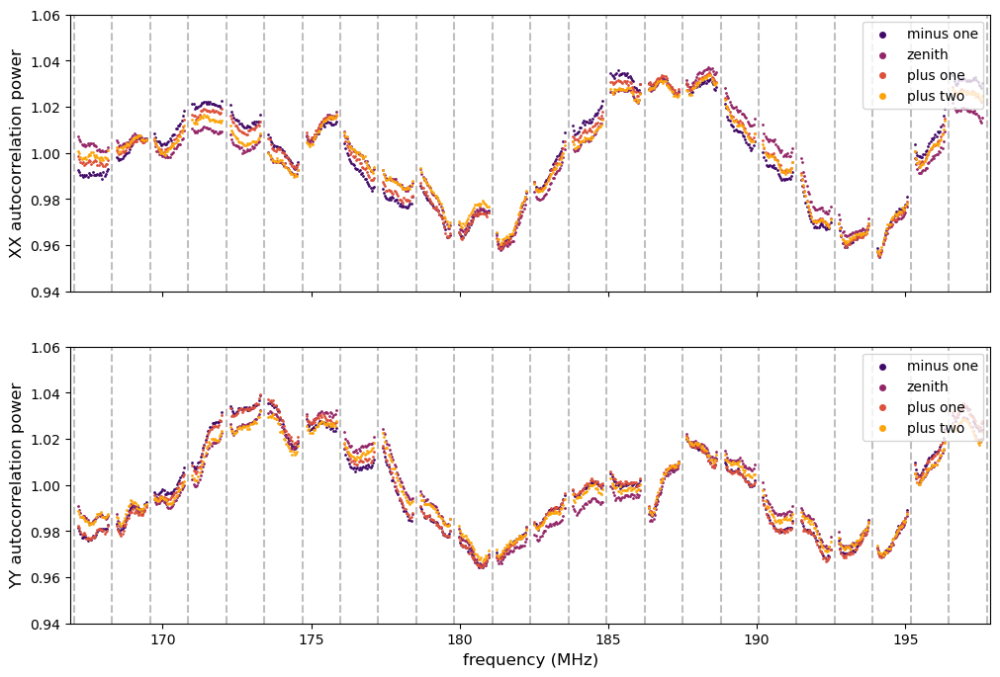

In [171]:
# make plot for each pointing
pols = ['XX', 'YY']
fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
for i in range(2):
    
    ax = axes[i]
    ax.scatter(freqs[freq_mask_full], cab_dat1[8, : ,i][freq_mask_full], color=my_colors1[1], label='minus one', s=1)
    
    ax.scatter(freqs[freq_mask_full], cab_dat2[8, : ,i][freq_mask_full], color=my_colors1[2], label='zenith', s=1)
    
    ax.scatter(freqs[freq_mask_full], cab_dat3[8, : ,i][freq_mask_full], color=my_colors1[3], label='plus one', s=1)
    
    ax.scatter(freqs[freq_mask_full], cab_dat4[8, : ,i][freq_mask_full], color=my_colors1[4], label='plus two', s=1)
    
    ymin, ymax = 0.94, 1.06
    ax.set_ylim(ymin, ymax)
    # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
    ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
    ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
    ax.legend(markerscale=4, loc='upper right')
    ax.set_ylabel(pols[i] + " autocorrelation power", fontsize=12)
    if i == 1:
        ax.set_xlabel("frequency (MHz)", fontsize=12)
    else:
        ax.tick_params(labelbottom=False)

fig.savefig('/Users/pstar/EORanalysis/thesis_plots/autos_each_pointing.pdf')
plt.show()
plt.close()

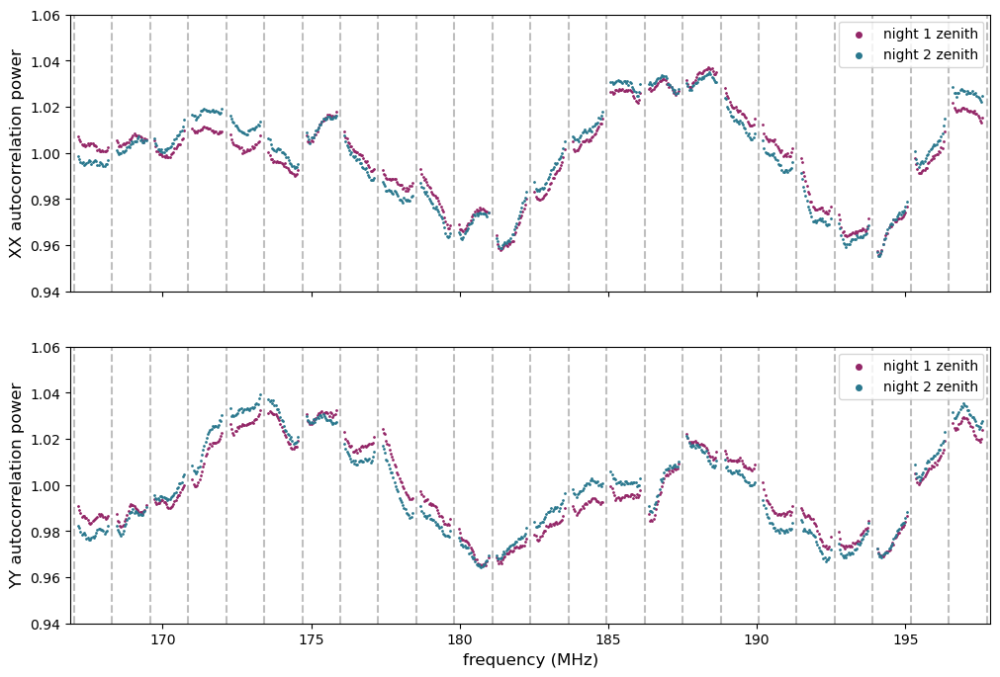

In [172]:
# make plot for each night
pols = ['XX', 'YY']
fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
for i in range(2):
    
    ax = axes[i]
    
    ax.scatter(freqs[freq_mask_full], cab_dat2[8, : ,i][freq_mask_full], color=my_colors1[2], label='night 1 zenith', s=1)
    
    ax.scatter(freqs[freq_mask_full], cab_dat3[8, : ,i][freq_mask_full], color=my_colors2[2], label='night 2 zenith', s=1)
    
    
    ymin, ymax = 0.94, 1.06
    ax.set_ylim(ymin, ymax)
    # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
    ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
    ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
    ax.legend(markerscale=4, loc='upper right')
    ax.set_ylabel(pols[i] + " autocorrelation power", fontsize=12)
    if i == 1:
        ax.set_xlabel("frequency (MHz)", fontsize=12)
    else:
        ax.tick_params(labelbottom=False)

fig.savefig('/Users/pstar/EORanalysis/thesis_plots/autos_two_night.pdf')
plt.show()
plt.close()

In [173]:
# look through cable plots
# plot two with flattish spectra: 82, 93
# plot two with mismatch xx & yy: 1009 & 63 though I do also like 41 for this
# plot two with residual narrowband: rfi 1033 & 96; do these as line plots for visual clarity
# plot two with gain issues in 21st coarse band: 
# plot one with 9 meter freq dependence: 
# plot one or two with possible gain discontinuities: 
def plot_rogues(uv, data, meta, ant_nums, freq_mask=freq_mask_full, plot_title=None, linestyle=None, ellipse=False):
    pols = ("XX", "YY")
    freqs = uv.freq_array[:] / 1e6
    gain_jump_freqs = freqs - 0.02
    gain_jump_freqs = np.concatenate((gain_jump_freqs, np.array([freqs[-1] + 0.02])))
    gain_jump_freqs = gain_jump_freqs[0::32]
    fig, axes = plt.subplots(nrows=2 * len(ant_nums), figsize=(12, 8 * len(ant_nums)))
    for j, a in enumerate(ant_nums):
        i = np.where(uv.ant_1_array == a)[0][0]
        ind = np.where(meta["ant_nums"] == a)[0][0]
        flavor = meta["cable_flavors"][ind]
        ant_name = meta["ant_names"][ind]
        rec = meta["recs"][ind]
        for k in range(2):
            ax = axes[2 * j + k]
            ymin, ymax = .9, 1.1
            ax.set_ylim(ymin, ymax)
            ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
            ax.set_xlim(gain_jump_freqs[0] - 0.12, gain_jump_freqs[-1] + 0.12)
            if linestyle == "line":
                data[i, :, k][~freq_mask_full] = np.nan
                ax.plot(freqs, data[i, :, k], color=my_colors2[j + 2], label=ant_name)
            else:
                ax.scatter(freqs[freq_mask_full], data[i, :, k][freq_mask_full], color=my_colors2[j + 2], label=ant_name, s=1)
            ax.set_ylabel(pols[k] + " autocorrelation power", fontsize=12)
            ax.legend(markerscale=4, loc='upper right')
            if j == len(ant_nums) - 1 and k == 1:
                ax.set_xlabel("frequency (MHz)", fontsize=12)
            else:
                ax.tick_params(labelbottom=False)
            if ellipse:
                ax.add_patch(Ellipse((freqs[688], 1), 2.5, .12, linewidth=3, fill=False, edgecolor="red"))
    if plot_title is not None:
        fig.savefig("/Users/pstar/EORanalysis/thesis_plots/" + plot_title + ".pdf")
    plt.show()
    plt.close()
        
        

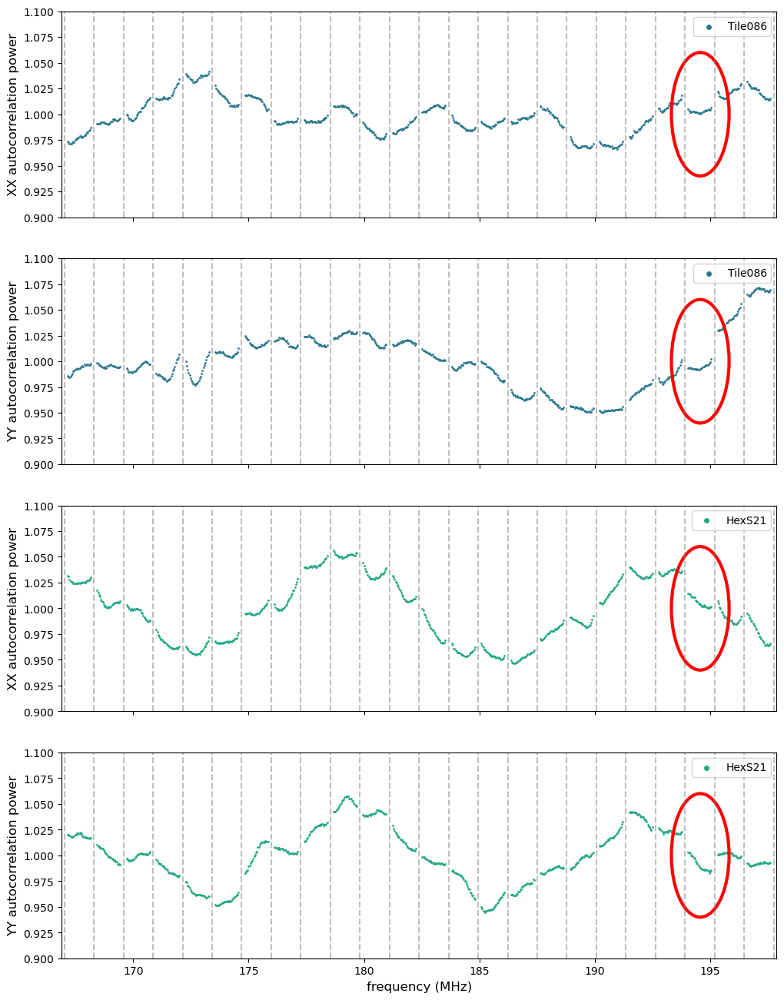

In [174]:
plot_rogues(uv2, cab_dat2, meta2, [86, 1057], ellipse=True, plot_title="auto_dip")

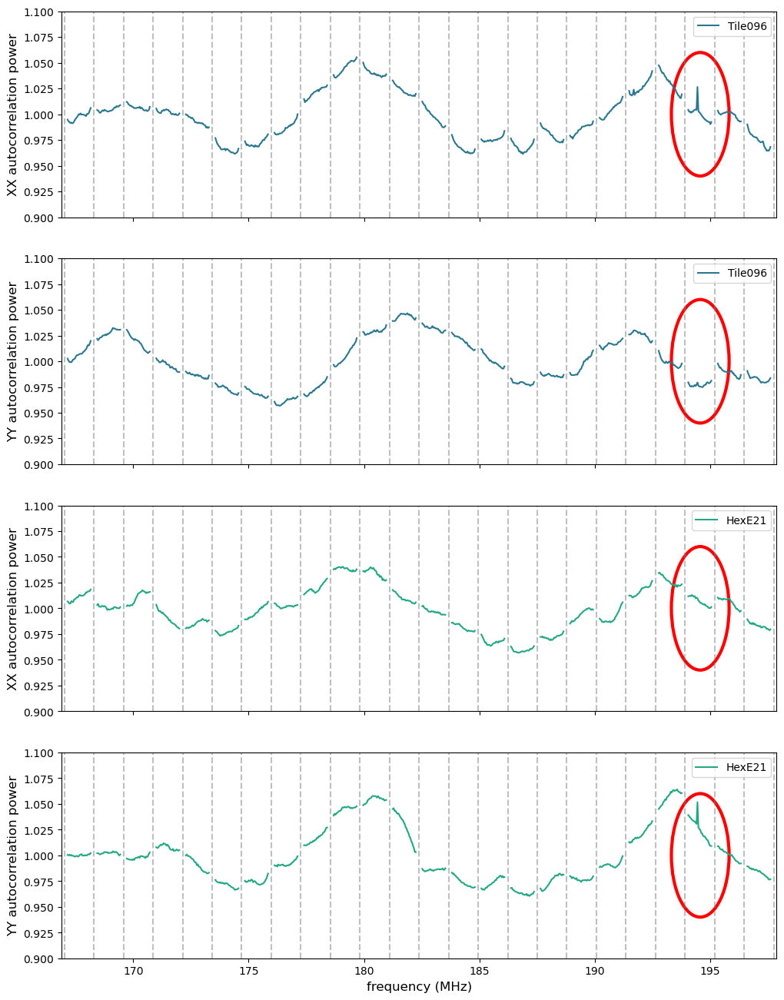

In [175]:
plot_rogues(uv2, cab_dat2, meta2, [96, 1021], linestyle="line", ellipse=True, plot_title="auto_dip_spike")

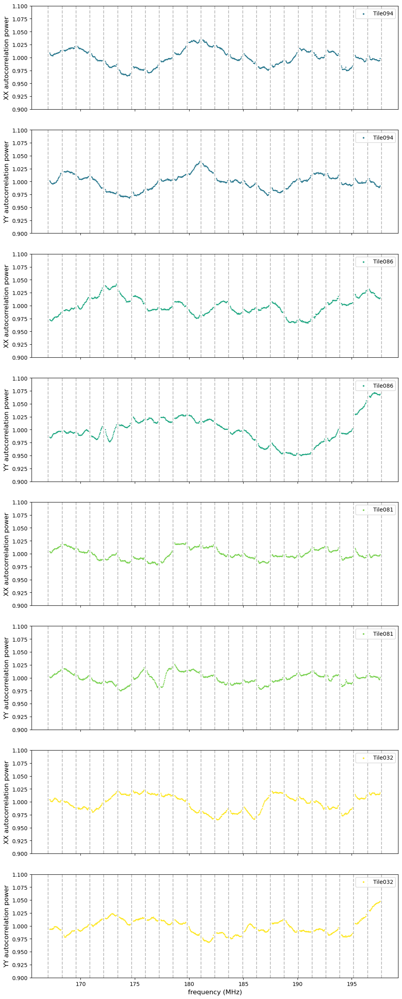

In [107]:
plot_rogues(uv2, cab_dat2, meta2, [94, 86, 81, 32])

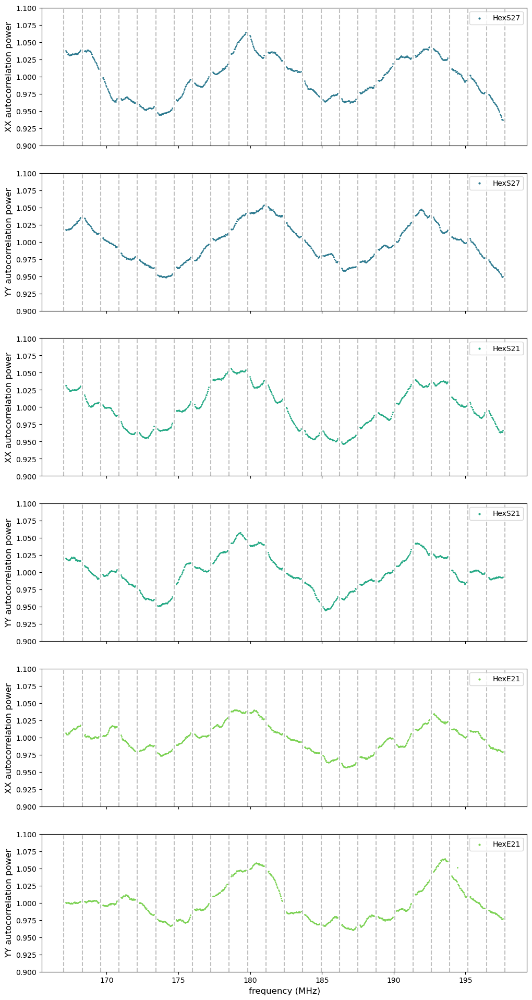

In [108]:
plot_rogues(uv2, cab_dat2, meta2, [1063, 1057, 1021])

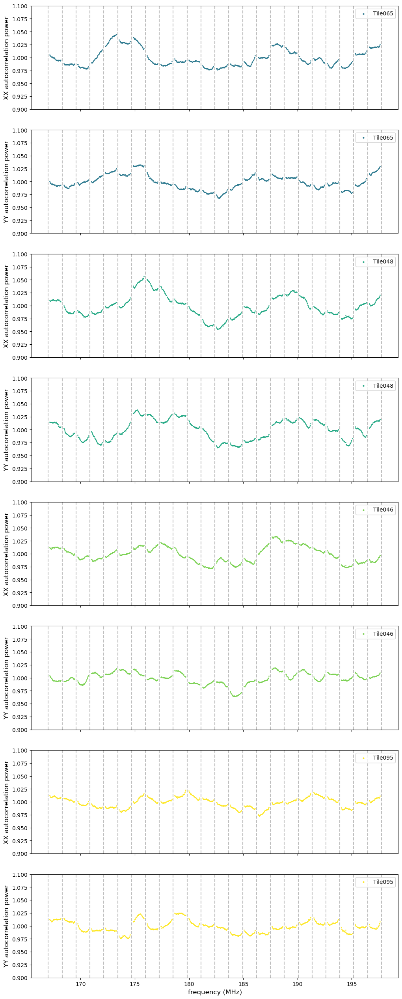

In [109]:
plot_rogues(uv2, cab_dat2, meta2, [65, 48, 46, 95])

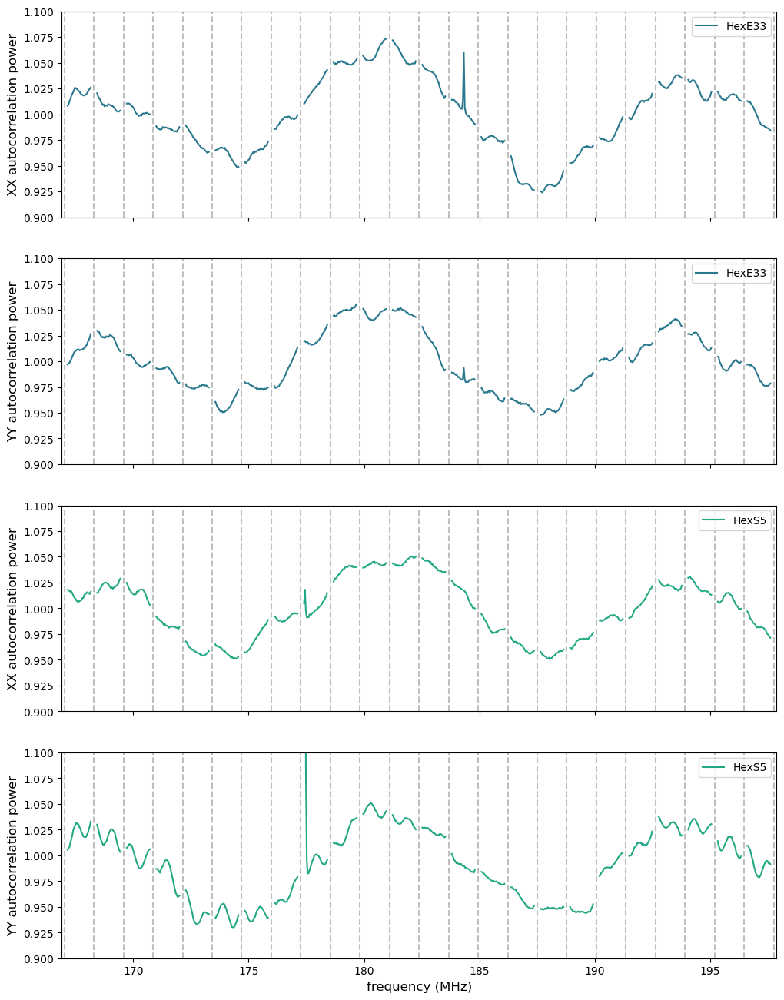

In [176]:
plot_rogues(uv2, cab_dat2, meta2, [1033, 1041], linestyle="line", plot_title="auto_spike")

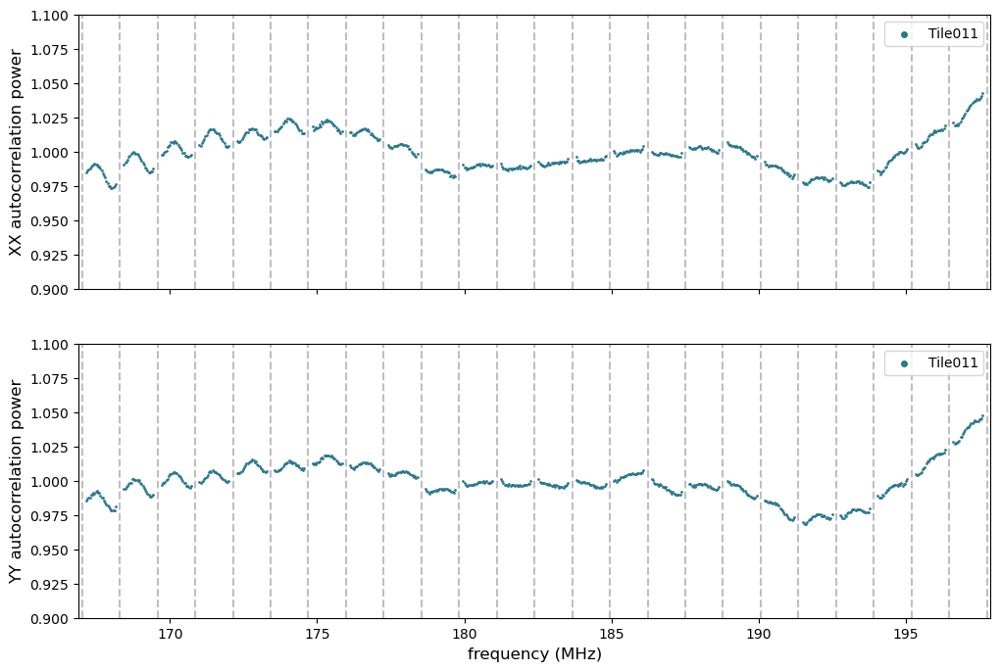

In [177]:
plot_rogues(uv2, cab_dat2, meta2, [11], plot_title="auto_ninety")

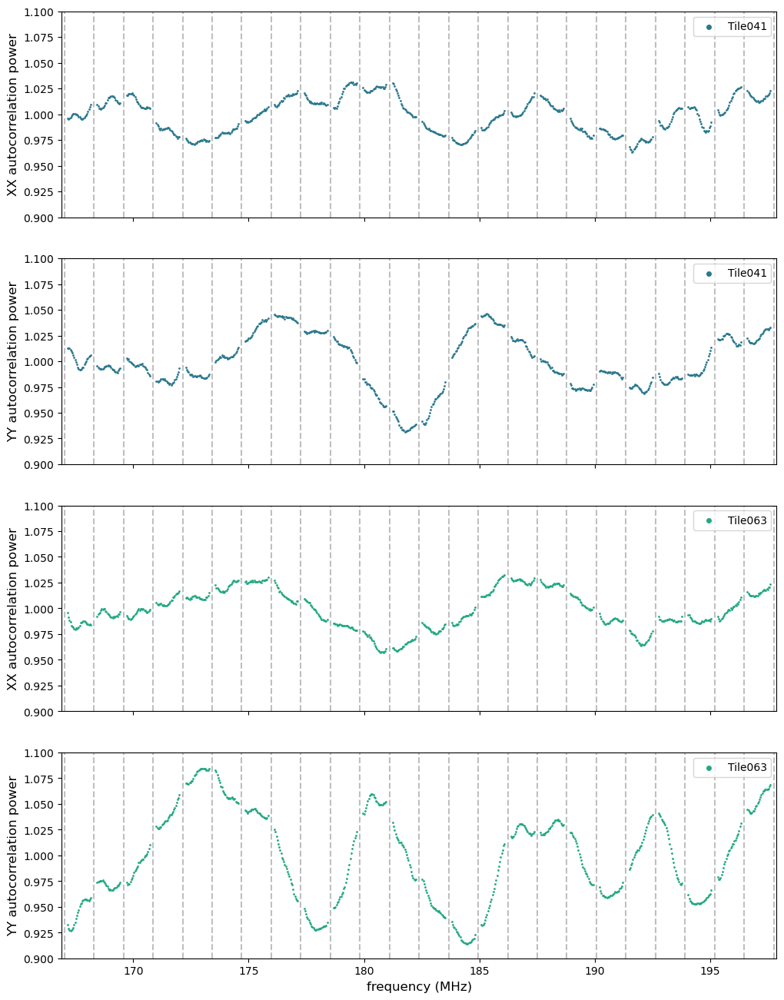

In [178]:
plot_rogues(uv2, cab_dat2, meta2, [41, 63], plot_title="auto_xy")

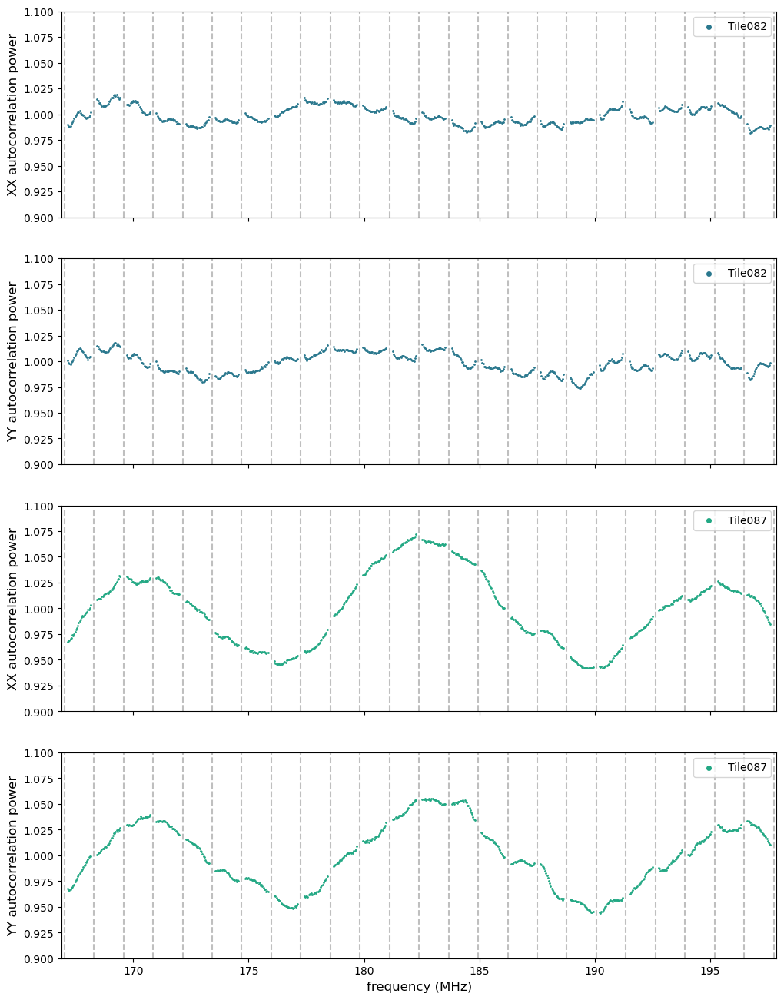

In [179]:
plot_rogues(uv2, cab_dat2, meta2, [82, 87], plot_title="auto_lumps")

In [ ]:
meta2.keys()

In [154]:
def plot_cable_residuals(uv, resx, resy, meta, refx=None, refy=None):
    freqs = uv.freq_array[:] / 1e6
    for i in range(uv.Nants_data):
        ant_num = uv.ant_1_array[i]
        ind = np.where(meta["ant_nums"] == ant_num)[0][0]
        flavor = meta["cable_flavors"][ind]
        ant_name = meta["ant_names"][ind]
        rec = meta["recs"][ind]
        gains = np.repeat(meta["gains"][ind, :], 32)
        gain_jump_freqs = freqs[1:][np.abs(np.diff(gains)) > 0]
        obs = str(uv.extra_keywords["GPSTIME"])
        fig, axes = plt.subplots(nrows=2, figsize=(12, 8))
        ax = axes[0]

        mean_pow = np.round(np.mean(uv.data_array.real[i, :, 0]), 0)
        masked_data = np.copy(resx[i, :])
        masked_data[~edge_mask] = np.nan
        # ax.scatter(freqs[freq_mask_full], resx[i, ...][freq_mask_full], color=my_colors2[2], s=1)
        ax.plot(freqs[freq_mask_full], resx[i, ...][freq_mask_full], color=my_colors2[2])
        ax.set_ylabel("XX autocorrelation power", fontsize=12)
        if refx is not None:
            ax.plot(freqs, refx[i])
        ymin, ymax = .9, 1.1
        ax.set_ylim(ymin, ymax)
        # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
        # ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
        # ax2 = ax.twinx()
        # ax2.plot(freqs, gains, color='grey', alpha=0.5)
        ax.set_title(obs + ' 40 kHz; ' + str(ant_name) + '\n flavor: ' + str(flavor))
        
        ax = axes[1]

        mean_pow = np.round(np.mean(uv.data_array.real[i, :, 0]), 0)
        masked_data = np.copy(resy[i, :])
        masked_data[~edge_mask] = np.nan
        # ax.scatter(freqs[freq_mask_full], resy[i, ...][freq_mask_full], color=my_colors2[2], s=1)
        ax.plot(freqs[freq_mask_full], resy[i, ...][freq_mask_full], color=my_colors2[2])
        ax.set_ylabel("YY autocorrelation power", fontsize=12)
        ax.set_xlabel("frequency (MHz)", fontsize=12)
        if refy is not None:
            ax.plot(freqs, refy[i])
        ymin, ymax = .9, 1.1
        ax.set_ylim(ymin, ymax)
        # ax.annotate('mean power: ' + str(mean_pow), (192, 4000))
        # ax.vlines(gain_jump_freqs, ymin, ymax, color='grey', alpha=0.5, linestyle='--')
        # ax2 = ax.twinx()
        # ax2.plot(freqs, gains, color='grey', alpha=0.5)
        if refy is not None:
            fig.savefig('/Users/pstar/EORanalysis/mwax_plots/pfb_autos/' + obs + '/' + obs + '_40_poly_ref_cable_res_masked' + "_" + str(rec) + "_" + str(ant_num) + '.png')
        else:
            fig.savefig('/Users/pstar/EORanalysis/mwax_plots/pfb_autos/' + obs + '/' + obs + '_40_poly_cable_res_masked' + "_" + str(rec) + "_" + str(ant_num) + '.png')
        plt.show()
        plt.close()

AttributeError: Line2D.set() got an unexpected keyword argument 's'

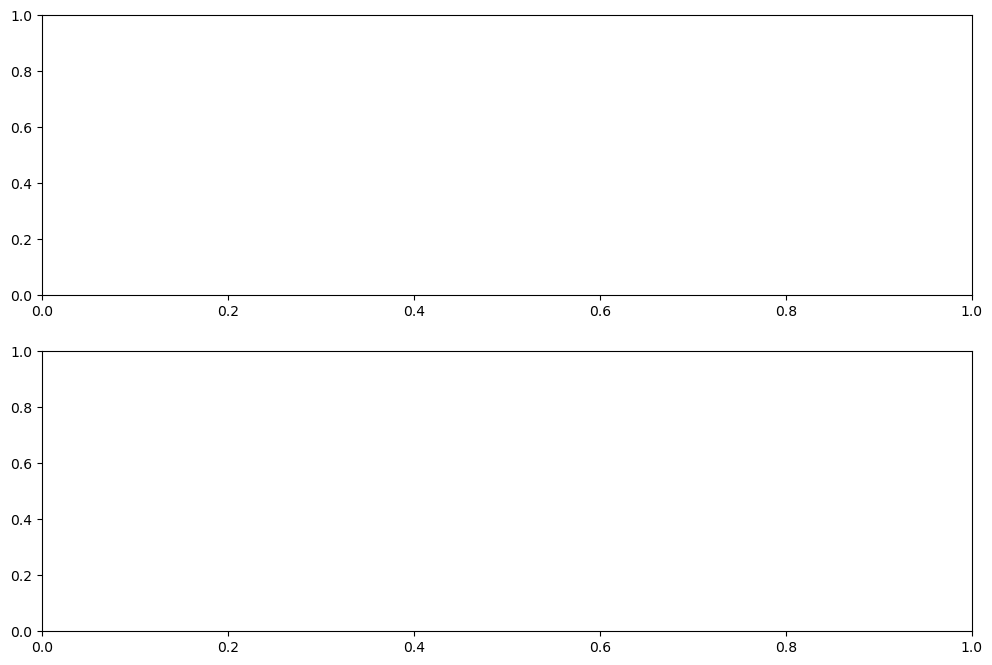

In [153]:
plot_cable_residuals(uv2, np.abs(cab_dat2[..., 0]), np.abs(cab_dat2[..., 1]), meta2)

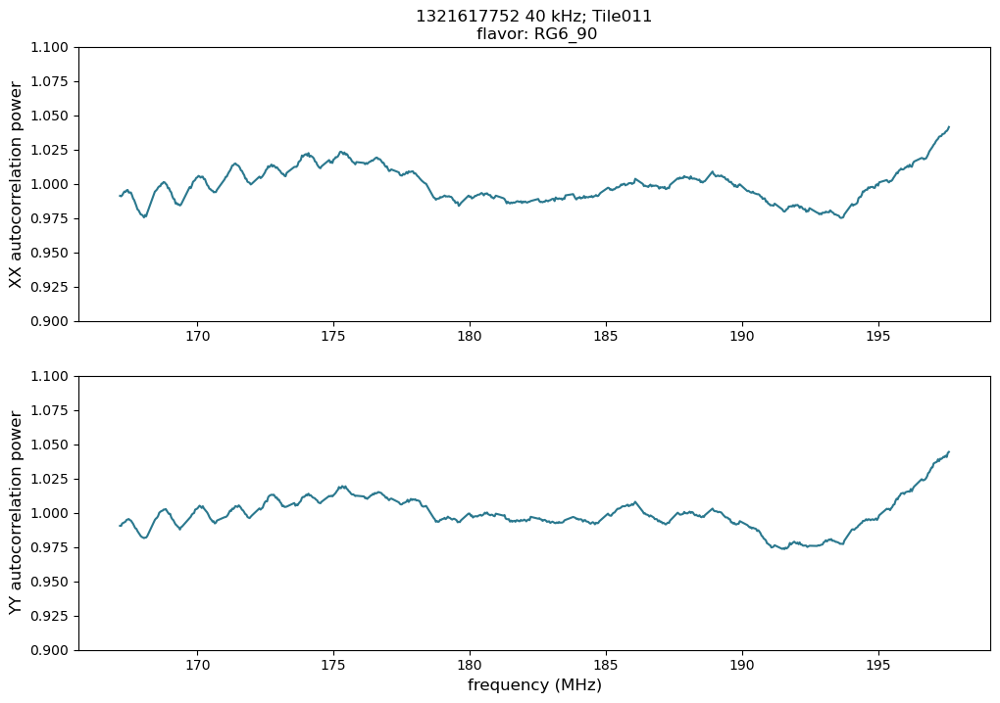

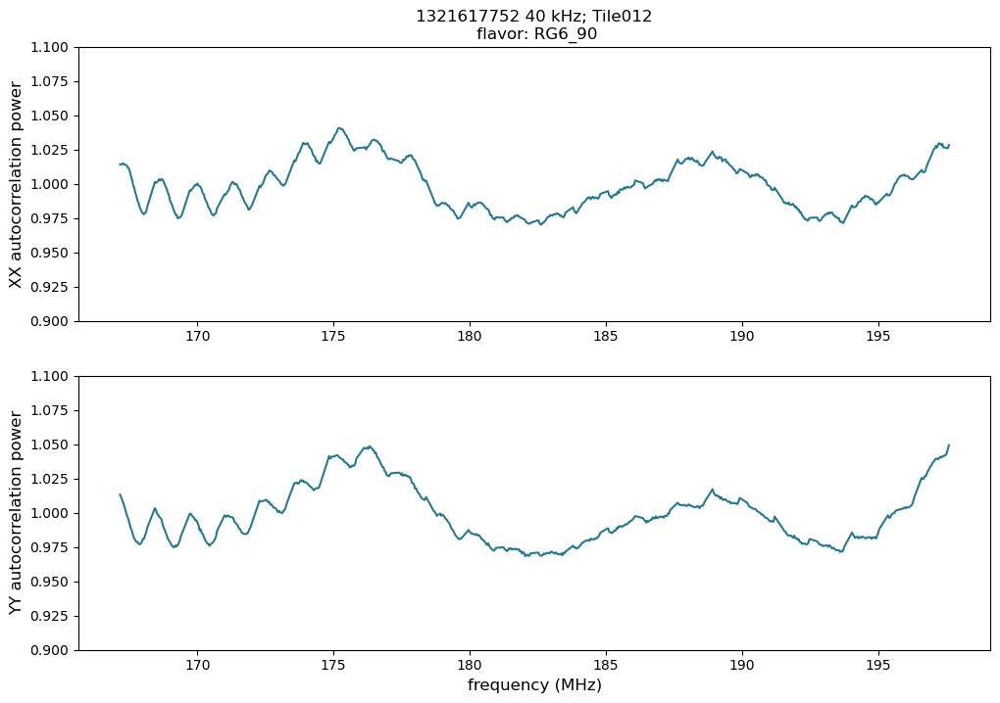

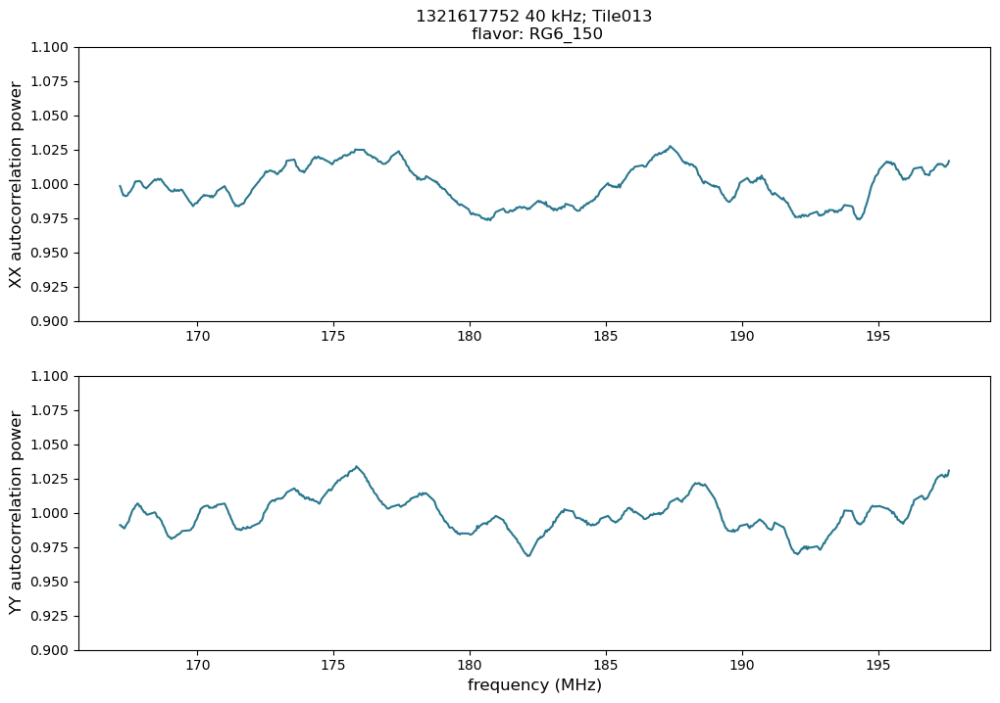

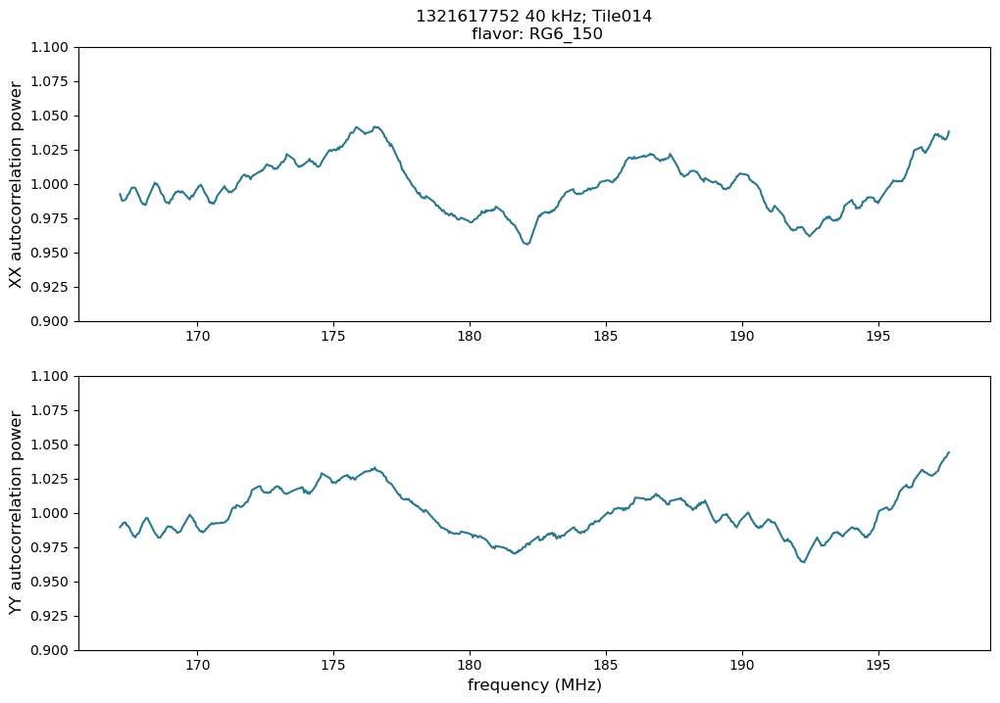

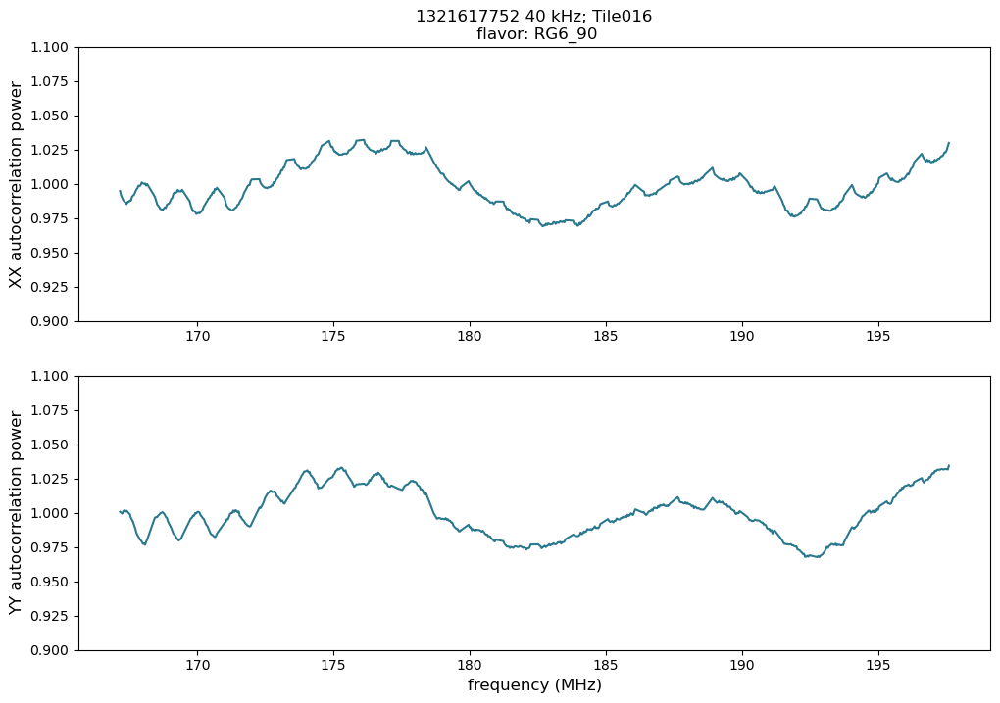

...

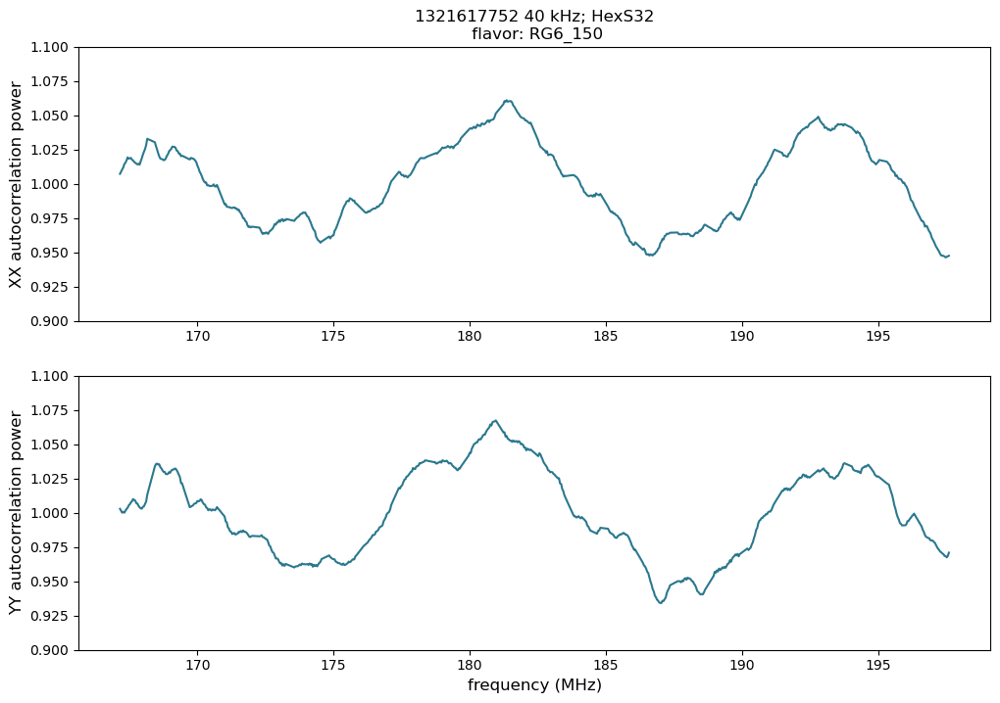

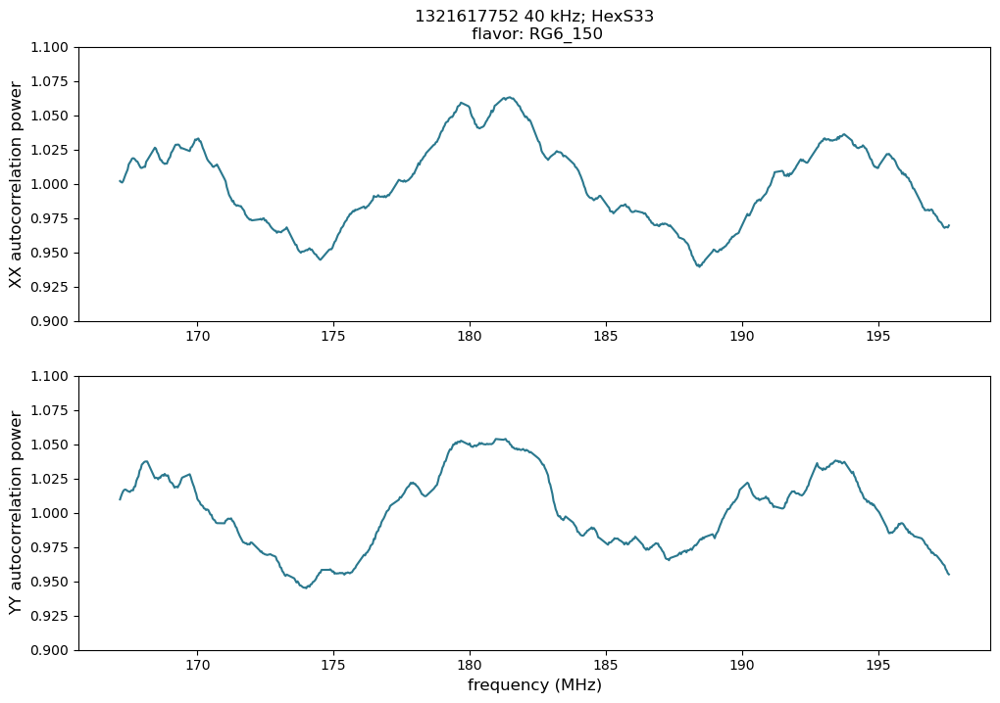

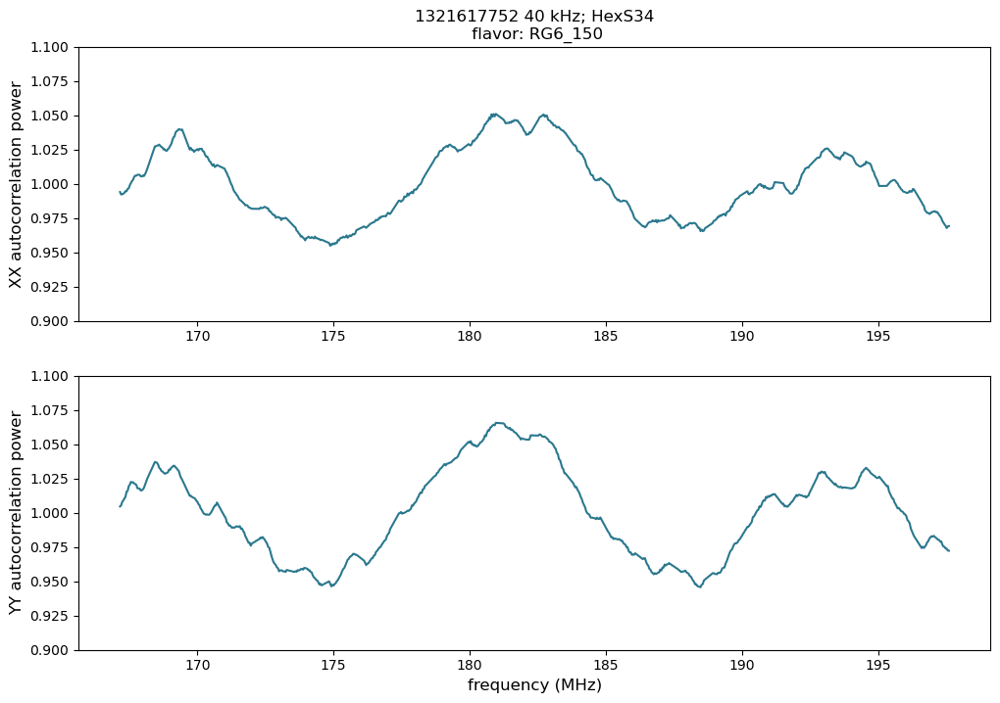

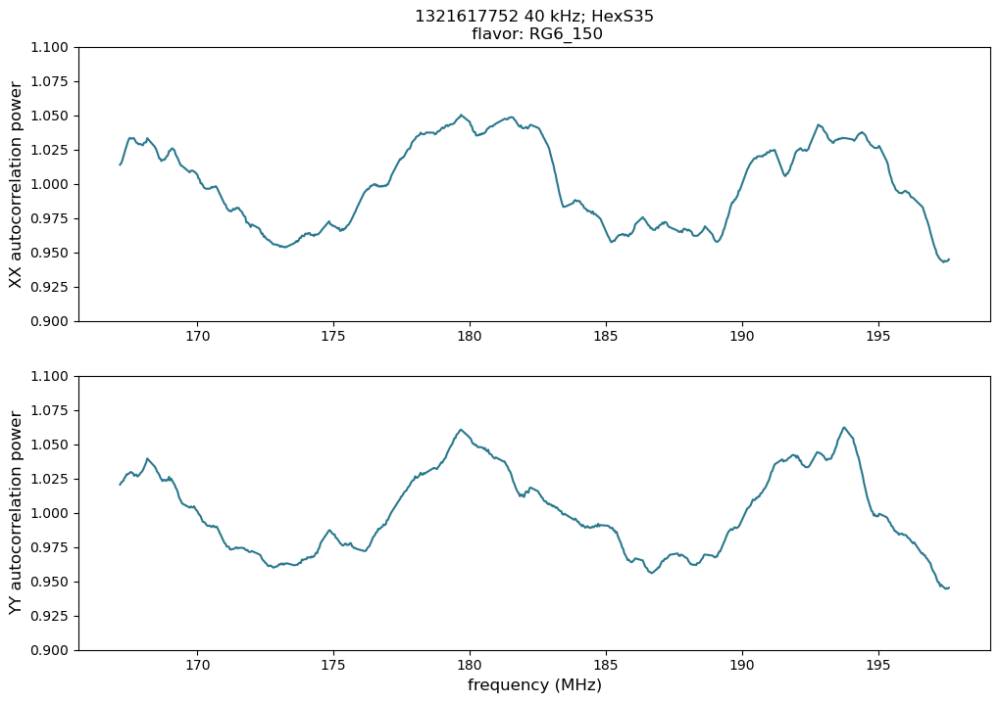

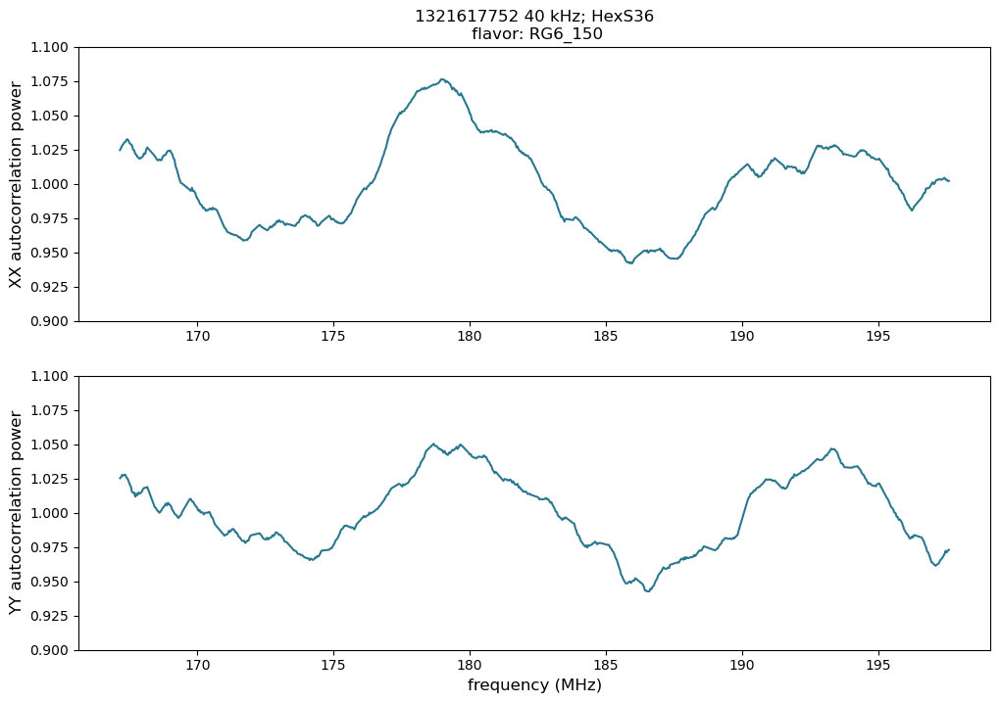

In [155]:
plot_cable_residuals(uv5, np.abs(cab_dat5[..., 0]), np.abs(cab_dat5[..., 1]), meta5)

In [ ]:
plot_cable_residuals(uv1, cab_dat1.real[..., 0], cab_dat1.real[..., 1], meta1, refx=ref1[..., 0], refy=ref1[..., 1])

In [ ]:
plot_cable_residuals(uv1, data1.real[..., 0], data1.real[..., 1], meta1)

In [ ]:
plot_cable_residuals(uv1, cab_dat1.real[..., 0], cab_dat1.real[..., 1], meta1)

In [ ]:
plot_cable_residuals(uv1, ref1[..., 0], ref1[..., 1], meta1)

In [ ]:
ref1[0, 0:10, 0]

In [ ]:
np.array([res_xx1.T, res_yy1.T]).T.shape

In [ ]:
res_cab_xx1, res_cab_yy1 = poly(uv1, cab_dat1, 3)

In [ ]:
plot_cable_residuals(uv1, res_cab_xx1, res_cab_yy1, meta1)

In [ ]:
# ok, get some delay spectra and try to figure out which is best
# make delay spectra of before and after
i = 11
N = uv1.Nfreqs
dt = 1 / (0.04 * N)
delay_array = np.arange(0, N * dt, dt)[0:384]
window = signal.blackmanharris(N)
# bc = uv1.data_array.real[i, :, 0] * window
# ac = uv1.data_array.real[0, :, 0] * window / reflection_term
ac = cab_dat1.real[i, :, 0] * window
bc = res_xx1[i, :] * window
# ac = res_cab_xx1.real[i, :] * window
bc_delay = np.fft.ifft(bc)
ac_delay = np.fft.ifft(ac)
bc_delay = bc_delay[0:384]
ac_delay = ac_delay[0:384]
fig, ax = plt.subplots(nrows=1, ncols=1,figsize = (10, 6))
ax.plot(delay_array, np.abs(bc_delay), color=my_colors[1])
ax.plot(delay_array, np.abs(ac_delay), color=my_colors[3])
ax.set_yscale('log')
# ax.set_ylim((1e-4, 1e-1))
plt.show()
plt.close()

In [ ]:
# test delay spectrum code
uv1_delay = ut.compute_delay_spectra(uv1, uv1.data_array.real, 'uv1')